# Install required packages

In [ ]:
# Install required packages
!pip install trackpy numpy scipy matplotlib pandas seaborn gdown pims

# Import libraries
import pims
import trackpy as tp
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
import seaborn as sns
import gdown

# Video Loading

In [ ]:
def download_from_gdrive(url, output_path='video.mp4'):
    """Download video from Google Drive"""
    file_id = url.split('/')[-2]
    direct_url = f'https://drive.google.com/uc?id={file_id}'
    gdown.download(direct_url, output_path, quiet=False)
    return output_path

@pims.pipeline
def gray(image):
    """Convert RGB video to grayscale"""
    # if len(image.shape) == 3:
    #     return image[:, :, 1]  # Take green channel
    # return image

    return image[:, :, 1]  # Take just the green channel

# Modify the load_video function to include preprocessing
def load_video(url):
    """Load and preprocess video"""
    video_path = download_from_gdrive(url)
    frames = pims.open(video_path)
    frames = gray(frames)

    # # Process frames to set empty areas to black
    # frames = process_video_frames(frames)

    print(f"Video loaded successfully:")
    print(f"Number of frames: {len(frames)}")
    print(f"Frame dimensions: {frames[0].shape}")

    return frames

def preprocess_frame(frame):
    """Preprocess frame by setting empty areas to black

    Args:
        frame: 2D numpy array containing the image data
    Returns:
        Processed frame with empty areas set to black
    """
    # Find the bounds of non-empty region
    rows = np.any(frame != 255, axis=1)
    cols = np.any(frame != 255, axis=0)

    # Get the boundaries
    rmin, rmax = np.where(rows)[0][[0, -1]]
    cmin, cmax = np.where(cols)[0][[0, -1]]

    # Create a mask for the empty areas
    mask = np.ones_like(frame, dtype=bool)
    mask[rmin:rmax+1, cmin:cmax+1] = False

    # Set empty areas to black (0)
    frame[mask] = 0

    return frame

def process_video_frames(frames):
    """Process all frames in the video"""
    processed_frames = []
    for frame in frames:
        processed = preprocess_frame(frame)
        processed_frames.append(processed)
    return processed_frames


# Obervations from the video

## Step 1: Read the Data

In [ ]:
# Load video
print("Loading video...")
url = 'https://drive.google.com/file/d/1mLjIIbHZ0spEw1vHQPeED_YnZp7umKI1/view?usp=sharing' # Cropped 4k

frames = load_video(url)

Loading video...


Downloading...
From: https://drive.google.com/uc?id=1mLjIIbHZ0spEw1vHQPeED_YnZp7umKI1
To: /content/video.mp4
100%|██████████| 51.6M/51.6M [00:01<00:00, 34.5MB/s]
Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7bb2d6f67d90>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pims/pyav_reader.py", line 365, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


Video loaded successfully:
Number of frames: 1000
Frame dimensions: (920, 918)


In [ ]:
frames

(ImageIOReader,) processed through proc_func. Original repr:
    <FramesSequenceND>
    Axes: 3
    Axis 'x' size: 918
    Axis 'y' size: 920
    Axis 't' size: 1000
    Pixel Datatype: uint8

In [ ]:
print(frames[0])  # the first frame

[[22 41 40 ... 77 76 68]
 [87 64 72 ... 65 80 32]
 [53 72 29 ... 73 58 88]
 ...
 [54 39 63 ... 45 34 61]
 [73 52 64 ... 42 67 84]
 [65 84 54 ... 65 68 53]]


Frame([[22, 41, 40, ..., 77, 76, 68],
       [87, 64, 72, ..., 65, 80, 32],
       [53, 72, 29, ..., 73, 58, 88],
       ...,
       [54, 39, 63, ..., 45, 34, 61],
       [73, 52, 64, ..., 42, 67, 84],
       [65, 84, 54, ..., 65, 68, 53]], dtype=uint8)
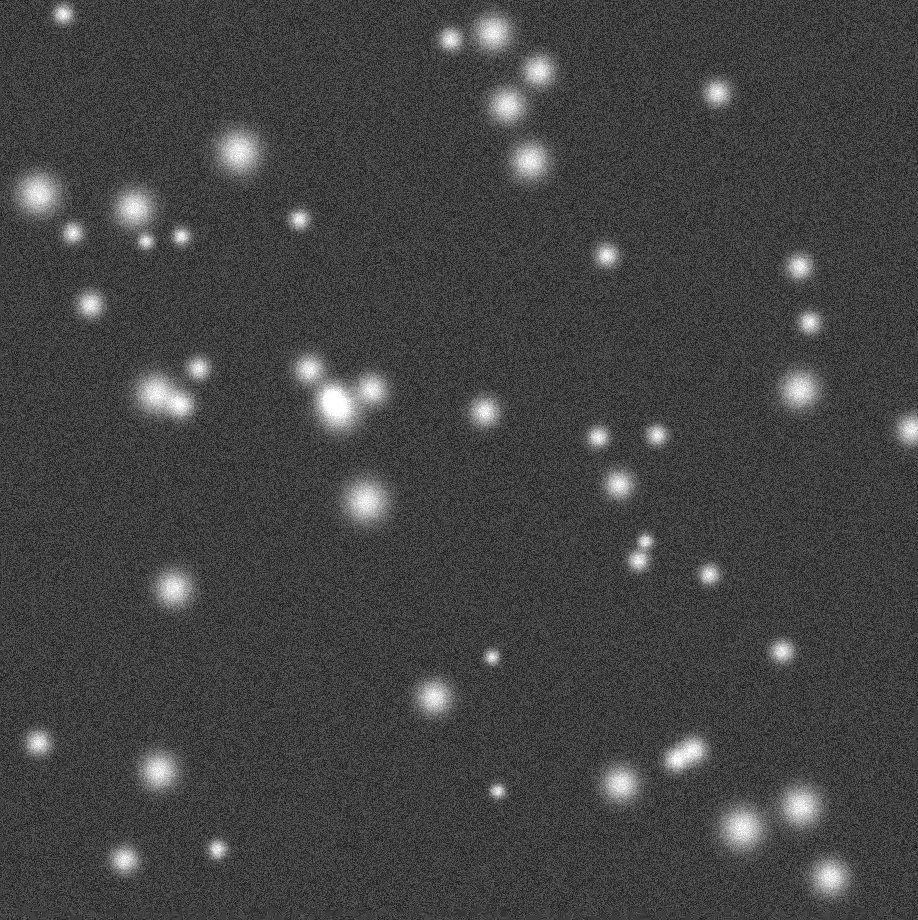

In [ ]:
frames[0]

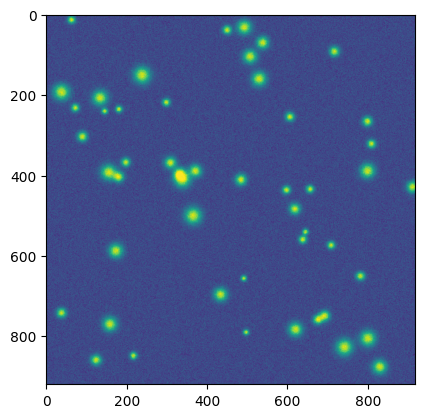

In [ ]:
plt.imshow(frames[0]);

In [ ]:
frames[123].frame_no

123

In [ ]:
frames[123].metadata  # Scientific formats can pass experiment meta data here.

{'new': False, 'axes': ['y', 'x'], 'coords': {'t': 123}}

## Step 2: Plot video in specific frames

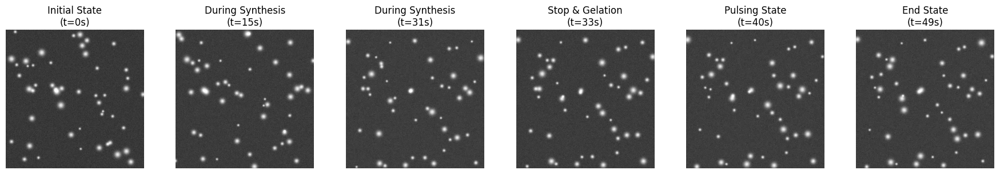

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Time points for key events
time_points = [0, 15, 31, 33, 40, 49]  # in seconds
frame_indices = [int(t * (1000/50)) for t in time_points]  # Convert to frame indices

# Create a figure to display frames
plt.figure(figsize=(18, 3))

# Add descriptive titles for each stage
titles = [
    "Initial State\n(t=0s)",
    "During Synthesis\n(t=15s)",
    "During Synthesis\n(t=31s)",
    "Stop & Gelation\n(t=33s)",
    "Pulsing State\n(t=40s)",
    "End State\n(t=49s)"
]

# Display frames
for i, (frame_idx, title) in enumerate(zip(frame_indices, titles)):
    plt.subplot(1, 6, i + 1)
    plt.imshow(frames[frame_idx], cmap='gray')
    plt.axis('off')
    plt.title(title)

plt.tight_layout()
plt.show()


# Tutorials Multiple Particles Tracking (MPT)

## Step 1: Read the Data

In [ ]:
# Load video
print("Loading video...")
# url = 'https://drive.google.com/file/d/1-mTp7X5D_2ub1U_Qw1qC9HLlWeXBelwC/view?usp=sharing' # Original video
url = 'https://drive.google.com/file/d/1mLjIIbHZ0spEw1vHQPeED_YnZp7umKI1/view?usp=sharing' # Cropped 4k
# url = 'https://drive.google.com/file/d/1-mTp7X5D_2ub1U_Qw1qC9HLlWeXBelwC/view?usp=sharing' # Cropped 1080p
# url = 'https://drive.google.com/file/d/1-mTp7X5D_2ub1U_Qw1qC9HLlWeXBelwC/view?usp=sharing' # Cropped 720p

frames = load_video(url)

Loading video...


Downloading...
From: https://drive.google.com/uc?id=1mLjIIbHZ0spEw1vHQPeED_YnZp7umKI1
To: /content/video.mp4
100%|██████████| 51.6M/51.6M [00:01<00:00, 46.0MB/s]
Exception ignored in: <function PyAVReaderIndexed.__del__ at 0x7ce412dd7be0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pims/pyav_reader.py", line 365, in __del__
    self._container.close()
AttributeError: 'NoneType' object has no attribute 'close'


Video loaded successfully:
Number of frames: 1000
Frame dimensions: (920, 918)


In [ ]:
frames

(ImageIOReader,) processed through proc_func. Original repr:
    <FramesSequenceND>
    Axes: 3
    Axis 'x' size: 918
    Axis 'y' size: 920
    Axis 't' size: 1000
    Pixel Datatype: uint8

In [ ]:
print(frames[0])  # the first frame

[[22 41 40 ... 77 76 68]
 [87 64 72 ... 65 80 32]
 [53 72 29 ... 73 58 88]
 ...
 [54 39 63 ... 45 34 61]
 [73 52 64 ... 42 67 84]
 [65 84 54 ... 65 68 53]]


Frame([[22, 41, 40, ..., 77, 76, 68],
       [87, 64, 72, ..., 65, 80, 32],
       [53, 72, 29, ..., 73, 58, 88],
       ...,
       [54, 39, 63, ..., 45, 34, 61],
       [73, 52, 64, ..., 42, 67, 84],
       [65, 84, 54, ..., 65, 68, 53]], dtype=uint8)
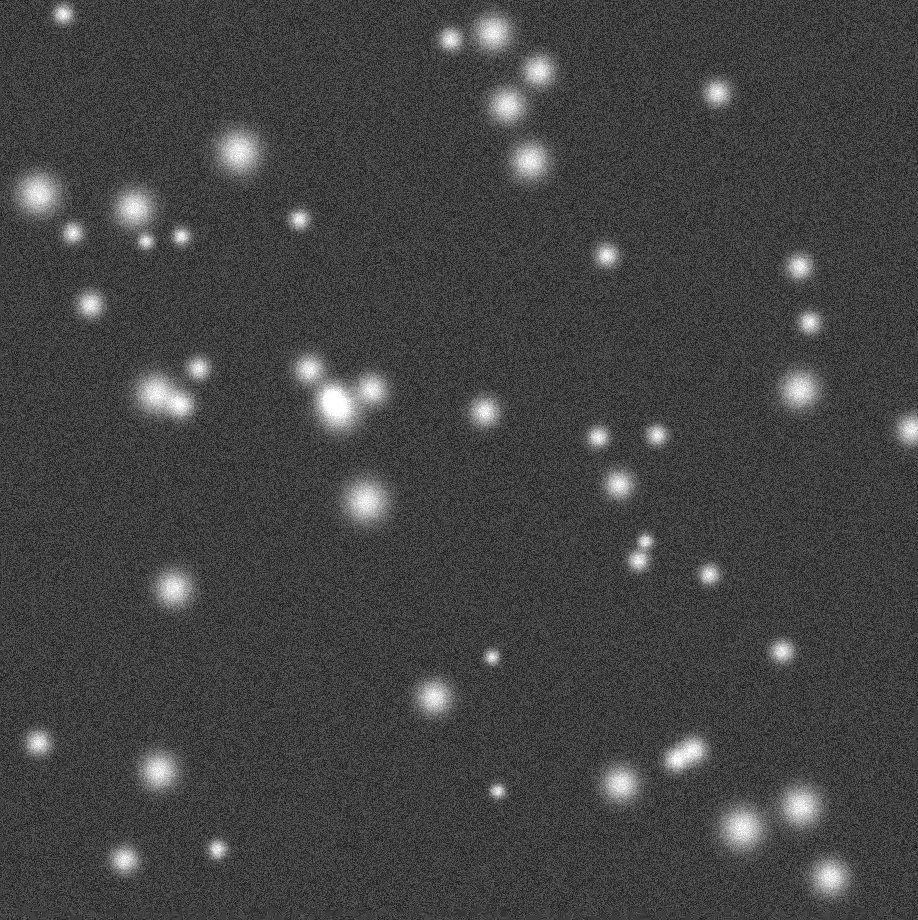

In [ ]:
frames[0]

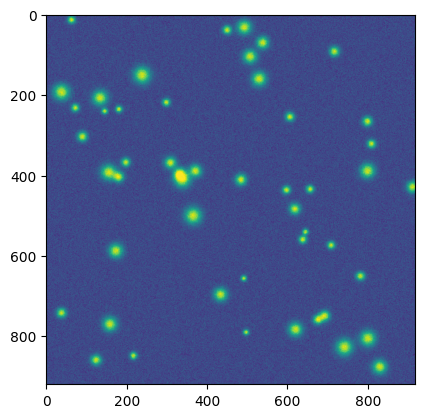

In [ ]:
plt.imshow(frames[0]);

In [ ]:
frames[123].frame_no

123

In [ ]:
frames[123].metadata  # Scientific formats can pass experiment meta data here.

{'new': False, 'axes': ['y', 'x'], 'coords': {'t': 123}}

## Step 2: Locate Features

In [ ]:
# f = tp.locate(frames[0], 11, invert=True)
# Our feature in this set of images are bright, we set the invert=False
f = tp.locate(frames[0], 11, invert=False) # Not good
# f = tp.locate(frames[0], 33, invert=False) # Maybe
# f = tp.locate(frames[0], 41, invert=False) # Maybe
# f = tp.locate(frames[0], 55, invert=False) # Maybe too large

In [ ]:
f.head()  # shows the first few rows of data

,y,x,mass,size,ecc,signal,raw_mass,ep,frame
0,5.368263,122.477545,135.513302,2.837147,0.159715,10.954668,4907.0,-0.525940,0
1,5.276212,494.887260,179.940568,2.347250,0.099324,11.157532,6127.0,0.470525,0
2,5.220472,507.545932,77.291270,2.518696,0.240256,9.737483,5328.0,-1.953751,0
3,4.440582,537.451091,250.943046,2.500929,0.057340,13.997632,5024.0,-0.659980,0
4,5.205044,812.642544,185.012173,2.782109,0.259016,9.940347,4909.0,-0.527772,0


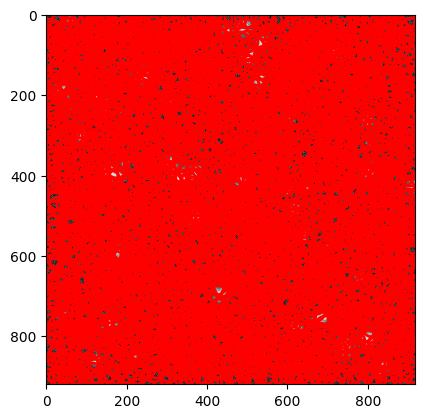

In [ ]:
tp.annotate(f, frames[0]);

### Refine parameters to elminate spurious features
Many of these circles are clearly wrong; they are fleeting peaks in brightness that aren't actually particles. Rejecting them often improves results and speeds up feature-finding. There are many ways to distinguish real particles from spurious ones. The most important way is to look at total brightness ("mass").

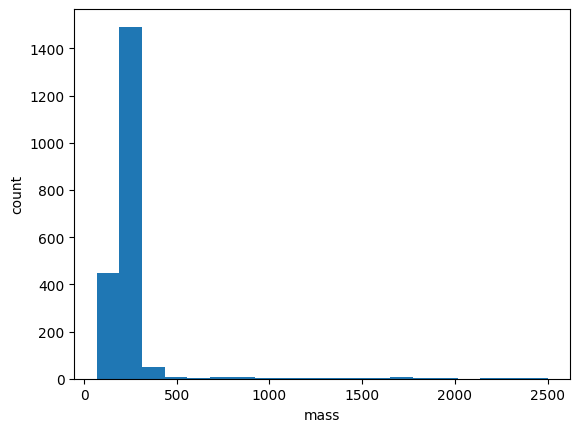

In [ ]:
# Refine parameters to elminate spurious features
fig, ax = plt.subplots()
ax.hist(f['mass'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='mass', ylabel='count');

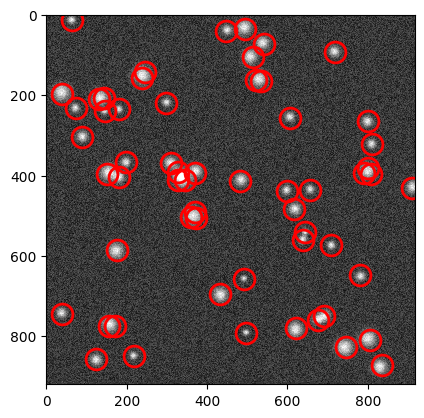

<Axes: >

In [ ]:
f = tp.locate(frames[0], 11, minmass=400)
tp.annotate(f, frames[0])

### Check for subpixel accuracy


/usr/local/lib/python3.10/dist-packages/trackpy/plots.py:638: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  axlist = f[pos_columns].applymap(lambda x: x % 1).hist()


array([[<Axes: title={'center': 'x'}>, <Axes: title={'center': 'y'}>]],
      dtype=object)

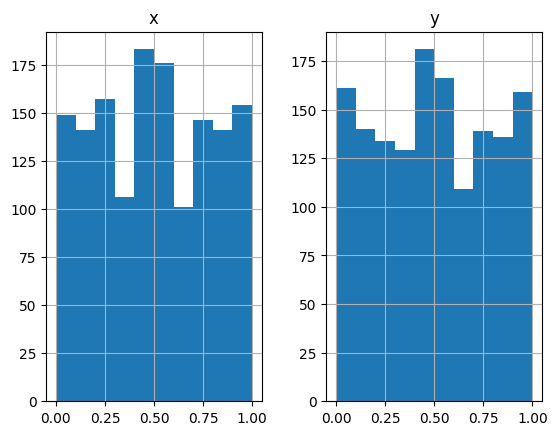

In [ ]:
tp.subpx_bias(tp.locate(frames[0], 11, minmass=200))

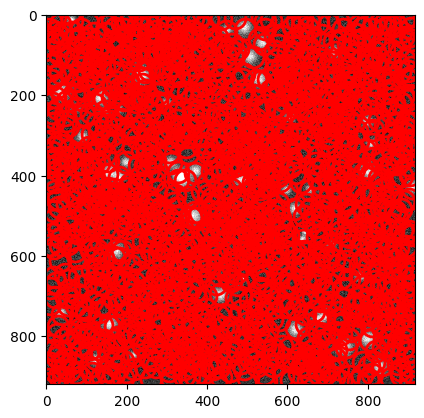

<Axes: >

In [ ]:
f = tp.locate(frames[0], 11, minmass=200)
tp.annotate(f, frames[0])

/usr/local/lib/python3.10/dist-packages/trackpy/plots.py:638: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  axlist = f[pos_columns].applymap(lambda x: x % 1).hist()


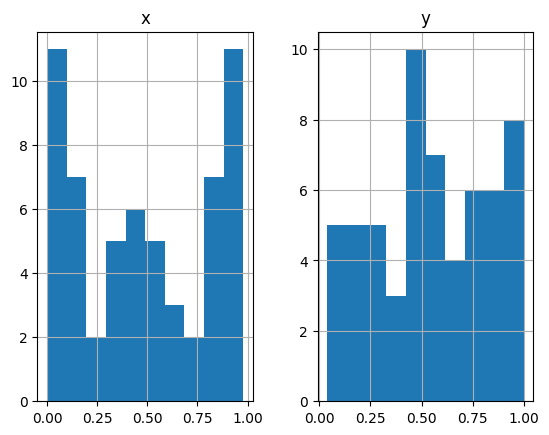

In [ ]:
tp.subpx_bias(tp.locate(frames[0], 11, minmass=400));

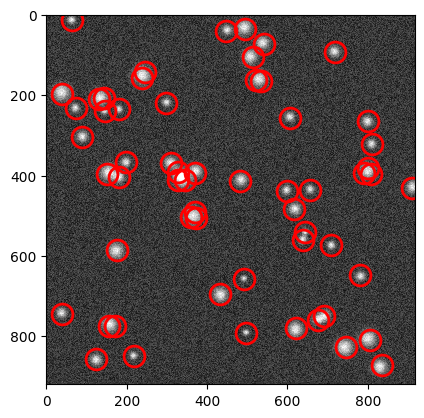

<Axes: >

In [ ]:
f = tp.locate(frames[0], 11, minmass=400)
tp.annotate(f, frames[0])

/usr/local/lib/python3.10/dist-packages/trackpy/plots.py:638: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  axlist = f[pos_columns].applymap(lambda x: x % 1).hist()


array([[<Axes: title={'center': 'x'}>, <Axes: title={'center': 'y'}>]],
      dtype=object)

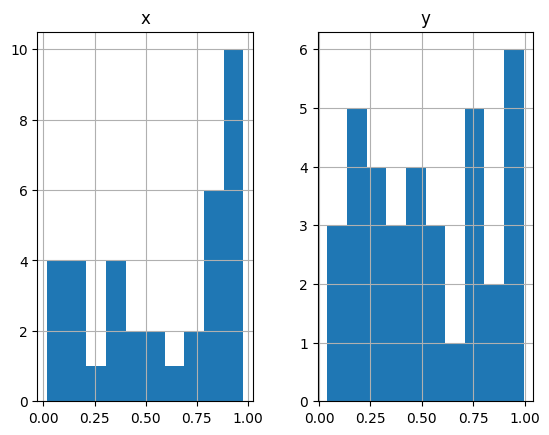

In [ ]:
tp.subpx_bias(tp.locate(frames[0], 11, minmass=800))

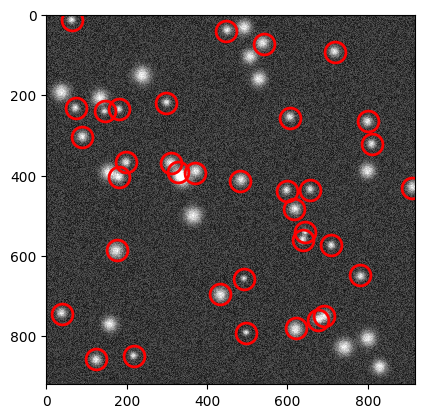

<Axes: >

In [ ]:
f = tp.locate(frames[0], 11, minmass=800)
tp.annotate(f, frames[0])

/usr/local/lib/python3.10/dist-packages/trackpy/feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


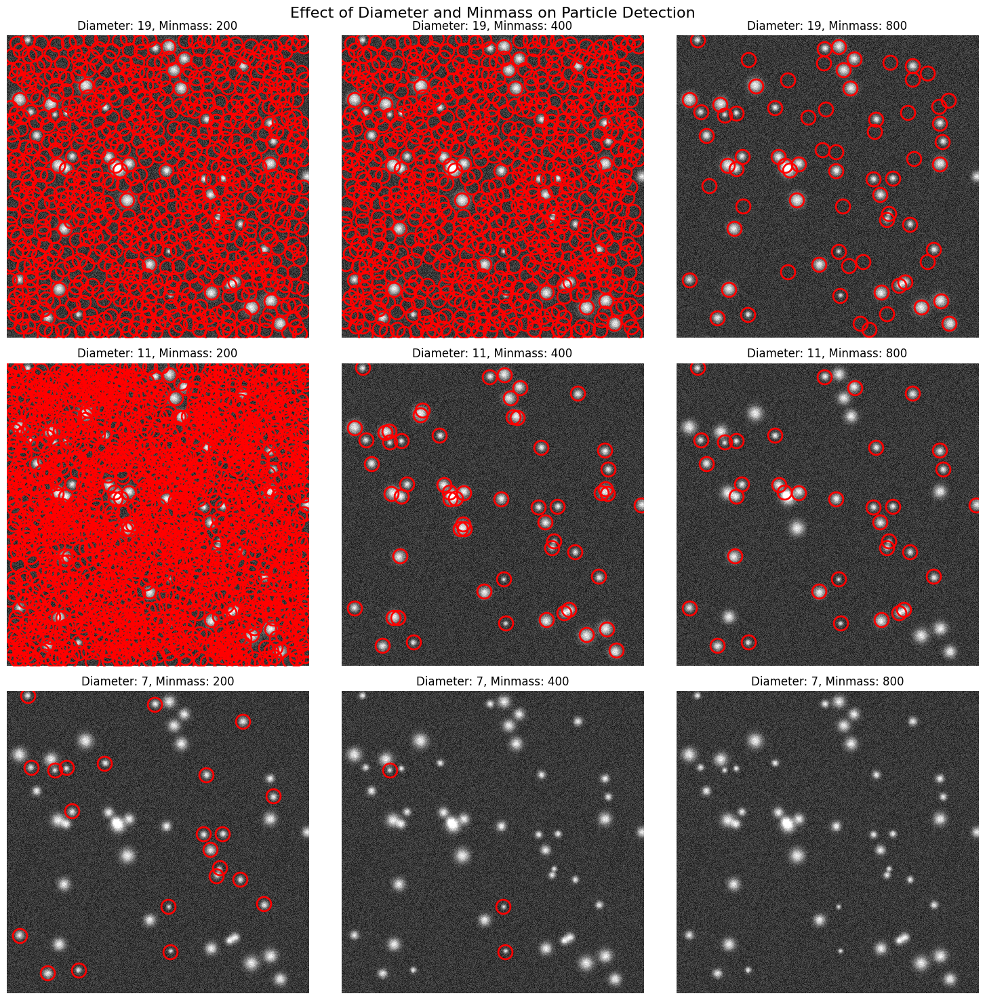

In [ ]:
import trackpy as tp
import matplotlib.pyplot as plt

# Assuming 'frames' is your video data
frame = frames[0]

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.suptitle("Effect of Diameter and Minmass on Particle Detection", fontsize=16)

diameters = [19, 11, 7]
minmasses = [200, 400, 800]

for i, size in enumerate(diameters):
    for j, minmass in enumerate(minmasses):
        f = tp.locate(frame, size, minmass=minmass)

        ax = axes[i, j]
        tp.annotate(f, frame, ax=ax)

        ax.set_title(f"Diameter: {size}, Minmass: {minmass}")
        ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# frames_list = list(frames[:300])
frames_list = list(frames[:])
diameter = 11
minmass = 400

In [ ]:
# %timeit -n 1 -r 1 tp.batch(frames_list, diameter, minmass=minmass, processes='auto');

In [ ]:
# %timeit -n 1 -r 1  tp.batch(frames_list, diameter, minmass=minmass, processes=1);

In [ ]:
# time(tp.batch(frames_list, diameter, minmass=minmass, processes='auto'))

In [ ]:
# time(tp.batch(frames_list, diameter, minmass=minmass, processes=1))

In [ ]:
f = tp.batch(frames_list, diameter, minmass=minmass, processes='auto')

Frame 999: 56 features


## Step 3: Link features into particle trajectories


In [ ]:
# tp.quiet()  # Turn off progress reports for best performance
# t = tp.link(f, 5, memory=3) # This results is bad
t = tp.link(f, 10, memory=3) # This results is fine
# t = tp.link(f, 20, memory=3) # This results is fine?

Frame 999: 56 trajectories present.


In [ ]:
t.head()

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
0,13.300469,63.699427,1948.510882,3.378300,0.062334,36.515561,17215.0,0.025825,0,0
32,413.537198,483.400506,1123.462079,3.391857,0.055043,22.923657,17675.0,0.024851,0,1
33,430.676537,910.717047,986.528727,3.401775,0.122829,21.300744,17995.0,0.024215,0,2
34,435.050056,656.439711,1823.749384,3.354293,0.011803,37.327017,17169.0,0.025927,0,3
35,437.159885,597.978223,1769.990364,3.443078,0.032900,33.066869,17621.0,0.024962,0,4


In [ ]:
t

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
0,13.300469,63.699427,1948.510882,3.378300,0.062334,36.515561,17215.0,0.025825,0,0
32,413.537198,483.400506,1123.462079,3.391857,0.055043,22.923657,17675.0,0.024851,0,1
33,430.676537,910.717047,986.528727,3.401775,0.122829,21.300744,17995.0,0.024215,0,2
34,435.050056,656.439711,1823.749384,3.354293,0.011803,37.327017,17169.0,0.025927,0,3
35,437.159885,597.978223,1769.990364,3.443078,0.032900,33.066869,17621.0,0.024962,0,4
...,...,...,...,...,...,...,...,...,...,...
55968,382.067774,677.560244,1687.287948,3.420593,0.016352,28.840805,17493.0,0.028878,999,2532
55969,383.972685,126.088657,2613.824026,3.290242,0.001016,51.429408,16157.0,0.032549,999,2844
55970,396.887242,159.957398,871.072991,3.407325,0.100469,16.538084,18012.0,0.027666,999,3782
55972,401.102105,439.498009,709.120777,3.437149,0.058597,14.319561,18000.0,0.027693,999,3784


### Filter spurious trajectories


In [ ]:
t1 = tp.filter_stubs(t, 25)
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t1['particle'].nunique())

Before: 3915
After: 482


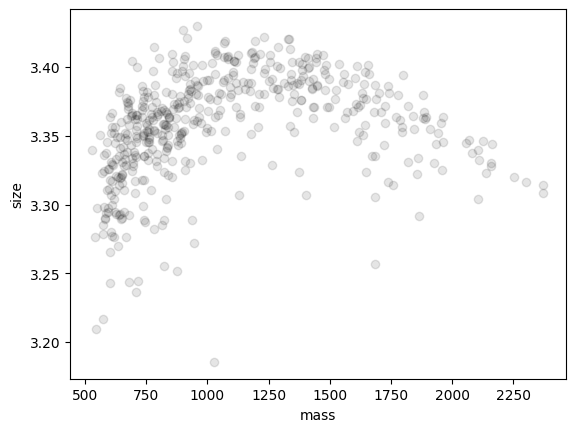

<Axes: xlabel='mass', ylabel='size'>

In [ ]:
plt.figure()
tp.mass_size(t1.groupby('particle').mean()) # convenience function -- just plots size vs. mass

In [ ]:
t1

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame,,,,,,,,,,
0,430.676537,910.717047,986.528727,3.401775,0.122829,21.300744,17995.0,0.024215,0,2
0,435.050056,656.439711,1823.749384,3.354293,0.011803,37.327017,17169.0,0.025927,0,3
0,437.159885,597.978223,1769.990364,3.443078,0.032900,33.066869,17621.0,0.024962,0,4
0,541.485483,644.943206,2228.869241,3.340115,0.050242,43.210080,16276.0,0.028072,0,9
0,656.921031,491.826871,2417.330106,3.261975,0.059004,51.730377,15758.0,0.029487,0,14
...,...,...,...,...,...,...,...,...,...,...
999,382.067774,677.560244,1687.287948,3.420593,0.016352,28.840805,17493.0,0.028878,999,2532
999,383.972685,126.088657,2613.824026,3.290242,0.001016,51.429408,16157.0,0.032549,999,2844
999,396.887242,159.957398,871.072991,3.407325,0.100469,16.538084,18012.0,0.027666,999,3782


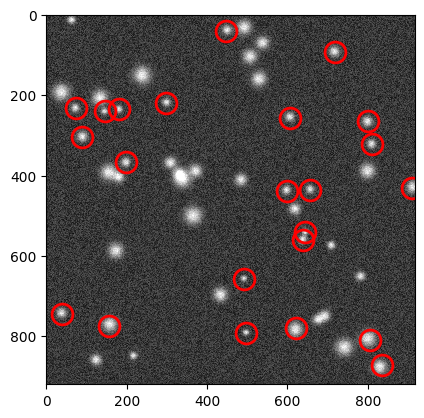

<Axes: >

In [ ]:
plt.figure()
tp.annotate(t1[t1['frame'] == 0], frames[0])

In [ ]:
t2 = t1[((t1['mass'] > 400) &
         (t1['size'] < 5) &
         (t1['size'] > 3.2)   &
         (t1['ecc'] < 0.6))]

print('Before:', t1['particle'].nunique())
print('After:' , t2['particle'].nunique())

Before: 482
After: 482


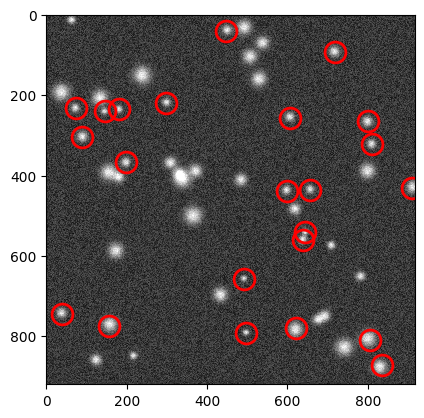

<Axes: >

In [ ]:
plt.figure()
tp.annotate(t2[t2['frame'] == 0], frames[0])

In [ ]:
# plt.figure()
# tp.plot_traj(t1)

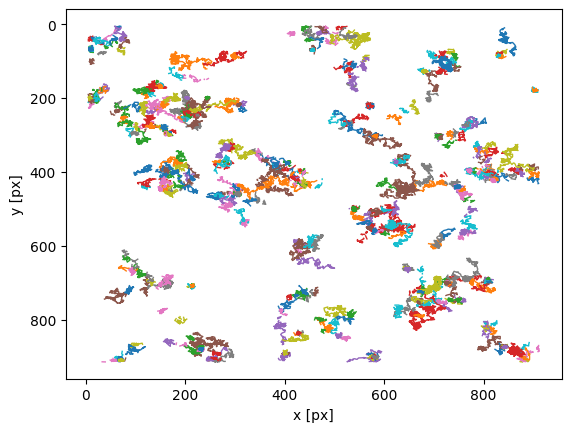

<Axes: xlabel='x [px]', ylabel='y [px]'>

In [ ]:
plt.figure()
tp.plot_traj(t2)

### Remove overall drift

In [ ]:
d = tp.compute_drift(t2)

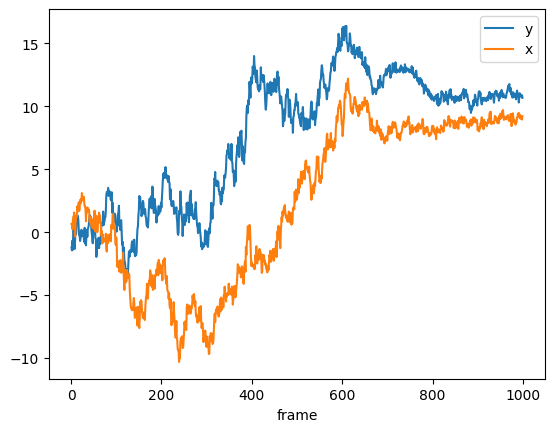

In [ ]:
d.plot()
plt.show()

In [ ]:
tm = tp.subtract_drift(t2.copy(), d)

In [ ]:
t2

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame_index,,,,,,,,,,
0,430.676537,910.717047,986.528727,3.401775,0.122829,21.300744,17995.0,0.024215,0,2
0,435.050056,656.439711,1823.749384,3.354293,0.011803,37.327017,17169.0,0.025927,0,3
0,437.159885,597.978223,1769.990364,3.443078,0.032900,33.066869,17621.0,0.024962,0,4
0,541.485483,644.943206,2228.869241,3.340115,0.050242,43.210080,16276.0,0.028072,0,9
0,656.921031,491.826871,2417.330106,3.261975,0.059004,51.730377,15758.0,0.029487,0,14
...,...,...,...,...,...,...,...,...,...,...
999,382.067774,677.560244,1687.287948,3.420593,0.016352,28.840805,17493.0,0.028878,999,2532
999,383.972685,126.088657,2613.824026,3.290242,0.001016,51.429408,16157.0,0.032549,999,2844
999,396.887242,159.957398,871.072991,3.407325,0.100469,16.538084,18012.0,0.027666,999,3782


In [ ]:
tm

y           x         mass      size       ecc  \
frame particle                                                            
0     2         430.676537  910.717047   986.528727  3.401775  0.122829   
      3         435.050056  656.439711  1823.749384  3.354293  0.011803   
      4         437.159885  597.978223  1769.990364  3.443078  0.032900   
      9         541.485483  644.943206  2228.869241  3.340115  0.050242   
      14        656.921031  491.826871  2417.330106  3.261975  0.059004   
...                    ...         ...          ...       ...       ...   
999   3784      390.430967  430.285188   709.120777  3.437149  0.058597   
      3785      888.505718  574.507258  1322.845045  3.470214  0.044085   
      3801      282.714124  155.963460  1751.625128  3.344007  0.025655   
      3803      519.412778  306.089350   547.975299  3.271710  0.109262   
      3828      685.471095  798.004808  1107.446584  3.387336  0.037930   

                   signal  raw_mass        ep  frame  particle  
frame particle                                                  
0     2         21.300744   17995.0  0.024215      0         2  
      3         37.327017   17169.0  0.025927      0         3  
      4         33.066869   17621.0  0.024962      0         4  
      9         43.210080   16276.0  0.028072      0         9  
      14        51.730377   15758.0  0.029487      0        14  
...                   ...       ...       ...    ...       ...  
999   3784      14.319561   18000.0  0.027693    999      3784  
      3785      22.386919   17402.0  0.029102    999      3785  
      3801      35.698060   16341.0  0.031989    999      3801  
      3803      14.319561   17652.0  0.028496    999      3803  
      3828      21.580183   18428.0  0.026766    999      3828  

[36383 rows x 10 columns]

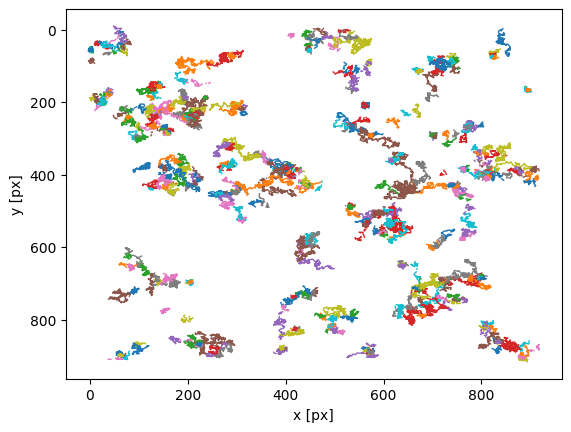

In [ ]:
ax = tp.plot_traj(tm)
plt.show()

## Step 4: Analyze trajectories

### Mean Squared Displacement of Individal Probes


In [ ]:
tm_reset = tm.reset_index(drop=True) # Set drop=True to avoid creating a new 'particle' column

In [ ]:
tm_reset

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
0,430.676537,910.717047,986.528727,3.401775,0.122829,21.300744,17995.0,0.024215,0,2
1,435.050056,656.439711,1823.749384,3.354293,0.011803,37.327017,17169.0,0.025927,0,3
2,437.159885,597.978223,1769.990364,3.443078,0.032900,33.066869,17621.0,0.024962,0,4
3,541.485483,644.943206,2228.869241,3.340115,0.050242,43.210080,16276.0,0.028072,0,9
4,656.921031,491.826871,2417.330106,3.261975,0.059004,51.730377,15758.0,0.029487,0,14
...,...,...,...,...,...,...,...,...,...,...
36378,390.430967,430.285188,709.120777,3.437149,0.058597,14.319561,18000.0,0.027693,999,3784
36379,888.505718,574.507258,1322.845045,3.470214,0.044085,22.386919,17402.0,0.029102,999,3785
36380,282.714124,155.963460,1751.625128,3.344007,0.025655,35.698060,16341.0,0.031989,999,3801
36381,519.412778,306.089350,547.975299,3.271710,0.109262,14.319561,17652.0,0.028496,999,3803


In [ ]:
max_frames = 1000  # Your total frames
im = tp.imsd(tm_reset, 100/285., 20, max_lagtime=max_frames)  # microns per pixel = 100/285., frames per second = 20; 1000 frames / 50 sec = 20 frames/sec

In [ ]:
im

,2,3,4,9,14,15,18,20,21,22,...,3772,3773,3780,3782,3784,3785,3801,3803,3828,3835
lag time [s],,,,,,,,,,,,,,,,,,,,,
0.05,2.528710,2.251110,2.617053,2.123435,2.248206,2.383962,2.158796,3.366977,2.304640,3.158670,...,1.716824,1.259184,1.333710,1.948456,0.815625,1.391674,0.108968,1.484594,0.785973,1.924265
0.10,4.036930,3.932077,4.570704,3.970330,3.967807,4.138072,3.430979,5.422223,4.137345,5.148225,...,2.099016,1.340800,1.121628,3.016375,1.265563,2.102646,0.155744,1.964524,0.936621,1.962923
0.15,5.915696,5.841723,6.840080,5.221783,5.432512,6.333953,4.346589,6.157003,5.634979,6.669581,...,2.314792,2.017809,1.724582,3.682670,1.259861,2.271788,0.211963,2.239192,1.282498,2.184370
0.20,7.212830,7.231665,9.294648,6.585189,7.407406,8.431239,3.761088,8.926981,7.046233,7.488601,...,2.462451,2.892576,2.091484,3.729890,1.638214,2.010496,0.282631,2.918965,1.799129,2.332758
0.25,8.577198,9.226914,11.887108,8.145148,9.057755,10.540497,6.026735,14.056566,8.645051,8.865326,...,2.086726,3.974963,2.283059,4.224852,1.902970,1.947975,0.383191,3.303432,2.005020,1.890750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38.95,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39.05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


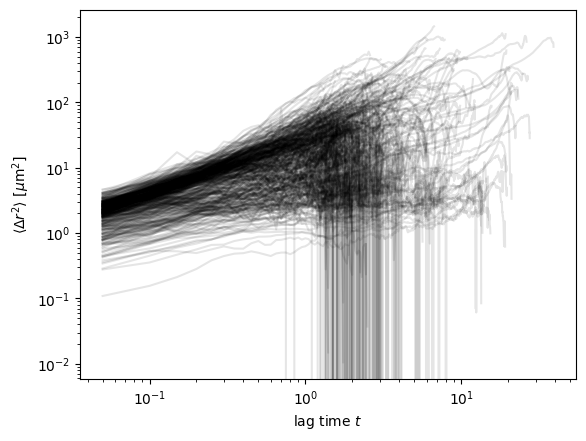

In [ ]:
fig, ax = plt.subplots()
ax.plot(im.index, im, 'k-', alpha=0.1)  # black lines, semitransparent
ax.set(ylabel=r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]',
       xlabel='lag time $t$')
ax.set_xscale('log')
ax.set_yscale('log')

### Ensemble Mean Squared Displacement


In [ ]:
# em = tp.emsd(tm_reset, 100/285., 20) # microns per pixel = 100/285., frames per second = 20; 1000 frames / 50 sec = 20 frames/sec

em = tp.emsd(tm_reset, 100/285., 20, max_lagtime=max_frames)  # microns per pixel = 100/285., frames per second = 20; 1000 frames / 50 sec = 20 frames/sec

In [ ]:
em

,msd
lagt,
0.05,1.704341
0.10,2.773879
0.15,3.797197
0.20,4.730196
0.25,5.653828
...,...
38.95,820.380969
39.00,825.029023
39.05,805.612408


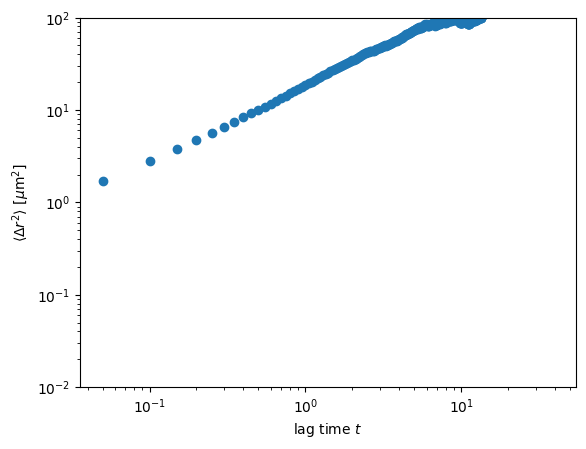

In [ ]:
fig, ax = plt.subplots()
ax.plot(em.index, em, 'o')
# ax.plot(em.lagt, em, 'o')
ax.set_xscale('log')
# ax.set_xscale('linear')
ax.set_yscale('log')
ax.set(ylabel=r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]',
       xlabel='lag time $t$')
ax.set(ylim=(1e-2, 1e2));

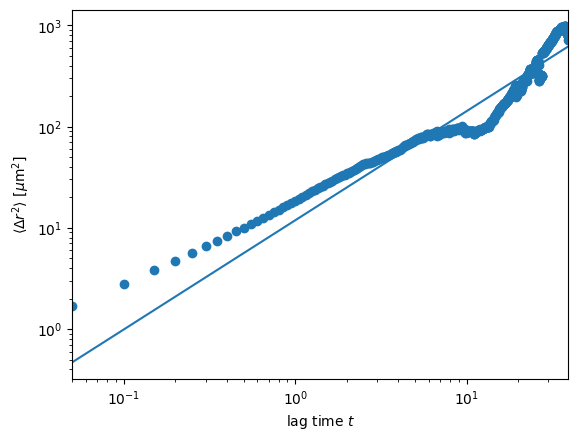

,n,A
msd,1.077896,11.848826


In [ ]:
plt.figure()
plt.ylabel(r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]')
plt.xlabel('lag time $t$');
tp.utils.fit_powerlaw(em)  # performs linear best fit in log space, plots]

## Step 5: Gel time calculation

In [ ]:
import numpy as np
import plotly.graph_objects as go
from scipy.optimize import curve_fit

def calculate_gel_time_mpt(msd, lagt, T=303, a=0.05e-6):
    """
    Calculate gel time using MPT-G'/G" crossover method and G*
    Parameters:
    msd: mean squared displacement values
    lagt: lag time values
    """
    # 1. Calculate local power law exponent α(ω)
    alpha = np.gradient(np.log(msd), np.log(lagt))

    # 2. Calculate complex modulus magnitude using GSER
    kB = 1.380649e-23  # Boltzmann constant in J/K
    G_magnitude = (kB * T) / (3 * np.pi * a * msd)
    G_star = G_magnitude  # Complex modulus magnitude

    # 3. Calculate storage (G') and loss (G") moduli
    G_prime = G_magnitude * np.cos(np.pi*alpha/2)
    G_double_prime = G_magnitude * np.sin(np.pi*alpha/2)

    # Find crossover point where G' exceeds G"
    crossover_indices = np.where(G_prime > G_double_prime)[0]

    if len(crossover_indices) > 0:
        gel_time = lagt[crossover_indices[0]]
        crossover_index = crossover_indices[0]
        crossover_times = [round(lagt[i], 2) for i in crossover_indices]
    else:
        gel_time = None
        crossover_index = None

    return gel_time, crossover_index, crossover_times, G_star, G_prime, G_double_prime

def plot_rheology(lagt, G_star, G_prime, G_double_prime, gel_time):
    fig = go.Figure()

    # 0. Calculate frequency points (omega)
    omega = 2 * np.pi / lagt

    # Plot G*, G' and G" with different markers
    fig.add_trace(go.Scatter(x=omega, y=G_star, mode='markers', name='G* (Complex)',
                              marker=dict(color='green', size=8, symbol='triangle-up-open')))
    fig.add_trace(go.Scatter(x=omega, y=G_prime, mode='markers', name="G' (Storage)",
                              marker=dict(color='blue', size=8, symbol='circle-open')))
    fig.add_trace(go.Scatter(x=omega, y=G_double_prime, mode='markers', name='G" (Loss)',
                             marker=dict(color='red', size=8, symbol='x-open')))

    # if gel_time is not None:
    #     fig.add_vline(x=2 * np.pi/gel_time, line_dash="dash", line_color="green",
    #                   annotation_text=f"Gel point: {gel_time:.2f} s",
    #                   annotation_position="top right")

    # Update layout
    fig.update_layout(
        xaxis_type="log",
        yaxis_type="log",
        xaxis=dict(
            title="ω (rad/s)",
            showgrid=True,
            range=[-1, 1],  # 0.1 to 10 rad/s
            gridwidth=1,
            gridcolor='lightgray'
        ),
        yaxis=dict(
            title="G', G\", G* (Pa)",
            showgrid=True,
            gridwidth=1,
            gridcolor='lightgray'
        ),
        title="Viscoelastic Moduli",
        showlegend=True,
        template='plotly_white',
        width=800,
        height=600
    )

    fig.show()


In [ ]:
# Example usage:
em_reset = em.reset_index()
# Extract 'lagt' and 'msd' columns
lagt = em_reset['lagt'].values  # Lag times
msd = em_reset['msd'].values    # Mean square displacement

# Calculate gel time and moduli
gel_time, crossover_idx, crossover_times, G_star, G_prime, G_double_prime = calculate_gel_time_mpt(msd, lagt, T=303, a=0.05e-6)

# Print gel time
if gel_time is not None:
    print(f"Gel time: {gel_time:.2f} seconds")
    print(f"Crossover index: {crossover_idx}")
    print(f"Crossover times: {crossover_times}")
    omega = [round(2 * np.pi / t, 2) for t in crossover_times]
    print(f"Crossover omega: {omega}")
else:
    print("No gel point detected")

# Plot results
plot_rheology(lagt, G_star, G_prime, G_double_prime, gel_time)

Gel time: 2.60 seconds
Crossover index: 51
Crossover times: [2.6, 2.65, 2.7, 2.75, 3.05, 3.25, 3.3, 3.8, 3.85, 4.65, 4.7, 5.2, 5.25, 5.45, 5.5, 5.55, 5.9, 5.95, 6.4, 6.45, 6.7, 6.75, 6.85, 6.9, 7.65, 7.85, 7.9, 8.1, 8.3, 8.9, 8.95, 9.3, 9.4, 9.45, 9.5, 9.6, 9.65, 9.85, 10.0, 10.1, 10.35, 10.4, 10.45, 10.5, 10.55, 10.6, 10.65, 10.7, 10.75, 10.8, 10.95, 11.35, 11.4, 11.6, 11.7, 12.15, 12.55, 12.6, 12.65, 12.7, 12.75, 12.8, 12.85, 13.05, 13.1, 13.25, 13.3, 13.35, 13.4, 13.45, 13.5, 13.55, 13.6, 13.65, 13.7, 13.75, 13.9, 13.95, 14.1, 15.4, 15.45, 15.65, 15.7, 16.35, 16.4, 17.5, 17.75, 17.8, 18.0, 18.05, 18.1, 18.15, 18.2, 18.25, 18.3, 18.8, 18.85, 18.9, 19.15, 19.35, 19.4, 19.5, 19.55, 19.65, 19.7, 19.75, 20.05, 20.2, 20.35, 20.7, 20.8, 20.85, 21.0, 21.05, 21.1, 21.2, 21.4, 21.45, 21.55, 21.6, 21.65, 21.7, 21.75, 21.8, 21.85, 21.9, 21.95, 22.0, 22.05, 22.1, 22.15, 22.2, 22.25, 22.3, 22.4, 22.5, 22.6, 22.65, 22.7, 22.75, 22.8, 22.85, 23.0, 24.0, 24.05, 24.1, 24.25, 24.5, 24.55, 24.8, 25.3, 

## Step 6. Other Macroscopic Quantities

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np

def calculate_complex_viscosity(G_star, omega):
    """
    Calculate complex viscosity from complex modulus
    η*(ω) = G*(ω)/iω = η'(ω) - iη''(ω)
    """
    # Dynamic viscosity
    eta_prime = G_double_prime/omega  # Real part

    # Out-of-phase viscosity
    eta_double_prime = G_prime/omega  # Imaginary part

    return eta_prime, eta_double_prime

def calculate_elasticity_metrics(G_prime, G_double_prime):
    """
    Calculate elasticity metrics
    """
    # Loss tangent (tan δ)
    tan_delta = G_double_prime/G_prime

    # Complex compliance
    J = 1/np.sqrt(G_prime**2 + G_double_prime**2)

    return tan_delta, J


def plot_rheological_properties(omega, eta_prime, eta_double_prime, tan_delta, J):
    """
    Create visualization of rheological properties with scatter plots only
    """
    fig = make_subplots(rows=2, cols=2,
                        subplot_titles=('Complex Viscosity', 'Loss Tangent',
                                      'Storage & Loss Moduli', 'Compliance'))

    # Plot complex viscosity components
    fig.add_trace(
        go.Scatter(
            x=omega,
            y=eta_prime,
            name="η' (Dynamic)",
            mode='markers',
            marker=dict(
                color='blue',
                size=8,
                symbol='circle-open'
            )
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=omega,
            y=eta_double_prime,
            name='η" (Out-of-phase)',
            mode='markers',
            marker=dict(
                color='red',
                size=8,
                symbol='x-open'
            )
        ),
        row=1, col=1
    )

    # Plot loss tangent
    fig.add_trace(
        go.Scatter(
            x=omega,
            y=tan_delta,
            name='tan(δ)',
            mode='markers',
            marker=dict(
                color='green',
                size=8,
                symbol='triangle-up-open'
            )
        ),
        row=1, col=2
    )

    # Plot moduli
    fig.add_trace(
        go.Scatter(
            x=omega,
            y=G_prime,
            name="G' (Storage)",
            mode='markers',
            marker=dict(
                color='blue',
                size=8,
                symbol='circle-open'
            )
        ),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=omega,
            y=G_double_prime,
            name='G" (Loss)',
            mode='markers',
            marker=dict(
                color='red',
                size=8,
                symbol='x-open'
            )
        ),
        row=2, col=1
    )

    # Plot compliance
    fig.add_trace(
        go.Scatter(
            x=omega,
            y=J,
            name='J (Compliance)',
            mode='markers',
            marker=dict(
                color='purple',
                size=8,
                symbol='diamond-open',
                line=dict(width=2)
            )
        ),
        row=2, col=2
    )

    # Update layout
    fig.update_layout(
        height=800,
        width=1000,
        title_text="Rheological Properties",
        showlegend=True,
        template='plotly_white'
    )

    # Update axes to log scale
    fig.update_xaxes(type="log", title="ω (rad/s)")
    fig.update_yaxes(type="log")

    fig.show()

In [ ]:
omega = 2 * np.pi / lagt

# Calculate viscosity and elasticity metrics
eta_prime, eta_double_prime = calculate_complex_viscosity(G_star, omega)
tan_delta, J = calculate_elasticity_metrics(G_prime, G_double_prime)

# Create visualization
plot_rheological_properties(omega, eta_prime, eta_double_prime, tan_delta, J)

In [ ]:
import pandas as pd
import numpy as np

# Assuming you have 'omega' and 'crossover_times' defined from previous calculations
# Replace with your actual variable names if they are different

# Example data (replace with your actual data)
omega = np.array(omega)
crossover_times = np.array(crossover_times)

# Get the minimum length among all arrays
min_len = min(len(crossover_times), len(omega), len(G_star), len(G_prime), len(G_double_prime), len(msd), len(eta_prime), len(eta_double_prime), len(tan_delta), len(J))

# Create the DataFrame using only the first min_len elements of each array
df = pd.DataFrame({
    'crossover_times (t)': crossover_times[:min_len],
    'omega (rad/s)': omega[:min_len],
    'msd': msd[:min_len],
    'G_star': G_star[:min_len],
    'G_prime': G_prime[:min_len],
    'G_double_prime': G_double_prime[:min_len],
    'eta_prime': eta_prime[:min_len],
    'eta_double_prime': eta_double_prime[:min_len],
    'tan_delta': tan_delta[:min_len],
    'J': J[:min_len]
})

# Display the DataFrame
df

,crossover_times (t),omega (rad/s),msd,G_star,G_prime,G_double_prime,eta_prime,eta_double_prime,tan_delta,J
0,2.60,125.663706,1.704341,5.208686e-15,2.345060e-15,4.650925e-15,3.701089e-17,1.866139e-17,1.983287,1.919870e+14
1,2.65,62.831853,2.773879,3.200348e-15,1.234134e-15,2.952820e-15,4.699558e-17,1.964186e-17,2.392624,3.124660e+14
2,2.70,41.887902,3.797197,2.337877e-15,8.326734e-16,2.184565e-15,5.215265e-17,1.987861e-17,2.623556,4.277385e+14
3,2.75,31.415927,4.730196,1.876747e-15,6.252602e-16,1.769528e-15,5.632581e-17,1.990265e-17,2.830066,5.328370e+14
4,3.05,25.132741,5.653828,1.570154e-15,4.758236e-16,1.496321e-15,5.953670e-17,1.893242e-17,3.144696,6.368802e+14
...,...,...,...,...,...,...,...,...,...,...
284,38.75,0.440925,115.246402,7.702956e-17,-2.397282e-17,7.320421e-17,1.660241e-16,-5.436935e-17,-3.053634,1.298203e+16
285,38.85,0.439384,115.639113,7.676796e-17,-1.526354e-17,7.523526e-17,1.712291e-16,-3.473854e-17,-4.929082,1.302627e+16
286,38.95,0.437853,116.158168,7.642493e-17,-4.544683e-17,6.144391e-17,1.403301e-16,-1.037948e-16,-1.351996,1.308474e+16
287,39.05,0.436332,116.776895,7.602000e-17,-6.825225e-17,3.347641e-17,7.672229e-17,-1.564226e-16,-0.490481,1.315443e+16


## Old: Gel time calculation

In [ ]:
import numpy as np
# Reset the index if 'lagt' is set as the index
em = em.reset_index()
# Extract 'lagt' and 'msd' columns
lagt = em['lagt'].values  # Lag times
msd = em['msd'].values    # Mean square displacement
omega = np.logspace(-1, 2, num=100)

In [ ]:
lagt, msd, omega

(array([ 0.05,  0.1 ,  0.15,  0.2 ,  0.25,  0.3 ,  0.35,  0.4 ,  0.45,
         0.5 ,  0.55,  0.6 ,  0.65,  0.7 ,  0.75,  0.8 ,  0.85,  0.9 ,
         0.95,  1.  ,  1.05,  1.1 ,  1.15,  1.2 ,  1.25,  1.3 ,  1.35,
         1.4 ,  1.45,  1.5 ,  1.55,  1.6 ,  1.65,  1.7 ,  1.75,  1.8 ,
         1.85,  1.9 ,  1.95,  2.  ,  2.05,  2.1 ,  2.15,  2.2 ,  2.25,
         2.3 ,  2.35,  2.4 ,  2.45,  2.5 ,  2.55,  2.6 ,  2.65,  2.7 ,
         2.75,  2.8 ,  2.85,  2.9 ,  2.95,  3.  ,  3.05,  3.1 ,  3.15,
         3.2 ,  3.25,  3.3 ,  3.35,  3.4 ,  3.45,  3.5 ,  3.55,  3.6 ,
         3.65,  3.7 ,  3.75,  3.8 ,  3.85,  3.9 ,  3.95,  4.  ,  4.05,
         4.1 ,  4.15,  4.2 ,  4.25,  4.3 ,  4.35,  4.4 ,  4.45,  4.5 ,
         4.55,  4.6 ,  4.65,  4.7 ,  4.75,  4.8 ,  4.85,  4.9 ,  4.95,
         5.  ,  5.05,  5.1 ,  5.15,  5.2 ,  5.25,  5.3 ,  5.35,  5.4 ,
         5.45,  5.5 ,  5.55,  5.6 ,  5.65,  5.7 ,  5.75,  5.8 ,  5.85,
         5.9 ,  5.95,  6.  ,  6.05,  6.1 ,  6.15,  6.2 ,  6.25,  6.3 ,
      

In [ ]:
def calculate_complex_modulus(lagt, msd, a, T):
    """
    Calculate the complex modulus G*(ω) from MSD.
    :param lag_times: Array of lag times τ.
    :param msd: Array of MSD values corresponding to lag times.
    :param a: Radius of tracer particles.
    :param T: Absolute temperature.
    :return: Frequencies ω, G'(ω), G''(ω).
    """
    kB = 1.380649e-23  # Boltzmann constant in J/K
    # T = 298            # Temperature in Kelvin
    T = 303            # Temperature in Kelvin # 30C
    # a = 1e-6           # Particle radius in meters
    a = 5*1e-8           # Particle radius in meters

   # Prepare frequency vector
omega = np.logspace(np.log10(1 / lagt.max()), np.log10(1 / lagt.min()), num=100)

# Initialize arrays for G' and G''
G_prime = np.zeros_like(omega)
G_double_prime = np.zeros_like(omega)

# a=1e-6
a = 5*1e-8
kB= 1.380649e-23
# T=298
T = 303
lagt = em['lagt'].values
msd = em['msd'].values

# Constants for the calculation
prefactor = 1 / (6 * np.pi * a)

# Calculate the complex modulus
for i, w in enumerate(omega):
    # Calculate the real and imaginary parts of J_star
    J_star_real = np.sum((msd / lagt) * ((w * lagt)**2) / (1 + (w * lagt)**2))
    J_star_imag = np.sum((msd / lagt) * (w * lagt) / (1 + (w * lagt)**2))

    J_star = prefactor * (J_star_real + 1j * J_star_imag)
    G_star = (kB * T) / J_star

    G_prime[i] = G_star.real
    G_double_prime[i] = G_star.imag

    omega, G_prime, G_double_prime


In [ ]:
omega, G_prime, G_double_prime

(array([ 0.02554278,  0.0273211 ,  0.02922322,  0.03125777,  0.03343397,
         0.03576167,  0.03825144,  0.04091454,  0.04376305,  0.04680988,
         0.05006883,  0.05355467,  0.0572832 ,  0.06127131,  0.06553708,
         0.07009983,  0.07498025,  0.08020045,  0.08578409,  0.09175646,
         0.09814464,  0.10497756,  0.1122862 ,  0.12010368,  0.12846542,
         0.13740931,  0.14697588,  0.15720849,  0.1681535 ,  0.17986051,
         0.19238258,  0.20577644,  0.2201028 ,  0.23542658,  0.25181721,
         0.26934897,  0.28810131,  0.30815921,  0.32961356,  0.35256158,
         0.37710727,  0.40336185,  0.4314443 ,  0.46148188,  0.49361071,
         0.52797637,  0.56473461,  0.60405199,  0.64610669,  0.69108928,
         0.7392036 ,  0.79066769,  0.84571475,  0.90459425,  0.967573  ,
         1.03493639,  1.10698968,  1.1840594 ,  1.26649479,  1.35466941,
         1.44898284,  1.54986245,  1.65776541,  1.77318068,  1.89663128,
         2.02867662,  2.1699151 ,  2.32098674,  2.4

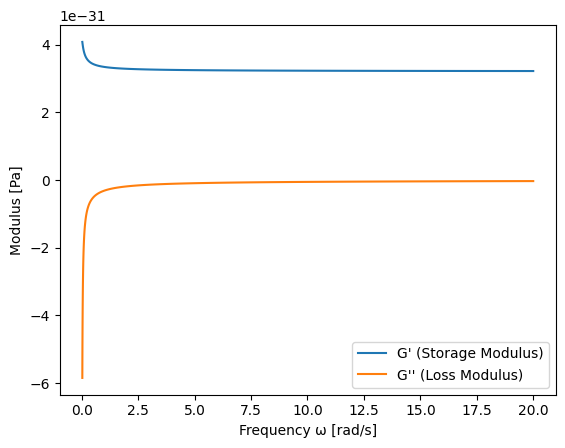

In [ ]:
import matplotlib.pyplot as plt
plt.plot(omega, G_prime, label="G' (Storage Modulus)")
plt.plot(omega, G_double_prime, label="G'' (Loss Modulus)")
plt.xlabel('Frequency ω [rad/s]')
plt.ylabel('Modulus [Pa]')
plt.legend()
plt.show()

In [ ]:
# Difference between G' and G''
delta_G = G_prime - G_double_prime

# Find indices where the sign of delta_G changes
sign_changes = np.where(np.diff(np.sign(delta_G)))[0]

crossover_frequencies = []
Gp_c_values = []
Gpp_c_values = []

if len(sign_changes) == 0:
    print("No crossover point found: G' and G'' do not cross over in the analyzed frequency range.")
else:
    for idx in sign_changes:
        # Frequencies and moduli before and after the crossover
        omega1, omega2 = omega[idx], omega[idx + 1]
        Gp1, Gp2 = G_prime[idx], G_prime[idx + 1]
        Gpp1, Gpp2 = G_double_prime[idx], G_double_prime[idx + 1]
        delta1, delta2 = delta_G[idx], delta_G[idx + 1]

        # Linear interpolation to find the crossover frequency
        omega_c = omega1 - delta1 * (omega2 - omega1) / (delta2 - delta1)

        # Interpolation factor
        fraction = (omega_c - omega1) / (omega2 - omega1)

        # Interpolate G' and G'' at the crossover frequency
        Gp_c = Gp1 + fraction * (Gp2 - Gp1)
        Gpp_c = Gpp1 + fraction * (Gpp2 - Gpp1)

        crossover_frequencies.append(omega_c)
        Gp_c_values.append(Gp_c)
        Gpp_c_values.append(Gpp_c)

        print(f"Crossover at ω = {omega_c:.3e} rad/s")
        print(f"G'(ω_c) = {Gp_c:.3e} Pa")
        print(f"G''(ω_c) = {Gpp_c:.3e} Pa\n")

No crossover point found: G' and G'' do not cross over in the analyzed frequency range.


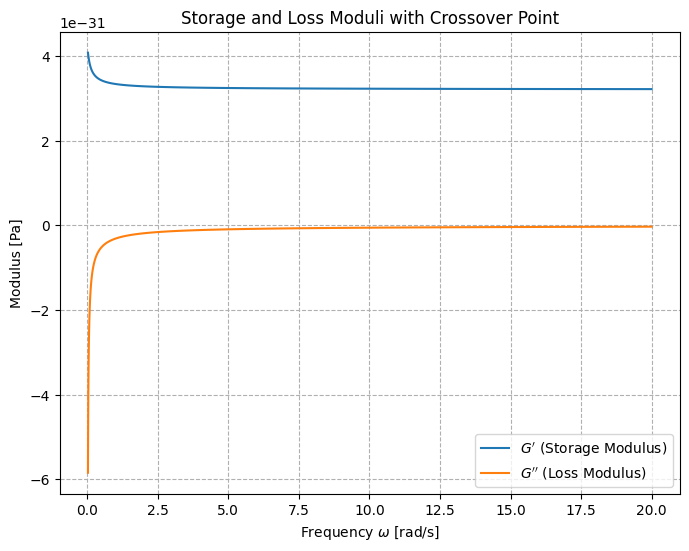

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(omega, G_prime, label="$G'$ (Storage Modulus)")
plt.plot(omega, G_double_prime, label="$G''$ (Loss Modulus)")

for omega_c in crossover_frequencies:
    plt.axvline(omega_c, color='k', linestyle='--', label=f'Crossover ω = {omega_c:.2e} rad/s')

plt.xlabel('Frequency $\omega$ [rad/s]')
plt.ylabel('Modulus [Pa]')
plt.title('Storage and Loss Moduli with Crossover Point')
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

In [ ]:
# Find G* at crossover point
# Assuming you have omega_c, Gp_c, and Gpp_c from your crossover calculations
# Gp_c and Gpp_c are the interpolated G' and G'' at omega_c

# Since G' equals G'' at the gelation point
G_c = Gp_c
 # or G_c = Gpp_c

# Compute the complex modulus at the gelation point
G_star_c = G_c + 1j * G_c
 # G^*(ω_c) = G_c (1 + i)

NameError: name 'Gp_c' is not defined

In [ ]:

import numpy as np
from scipy.optimize import curve_fit

# Assuming omega and G_double_prime are your data arrays

# Linear fit: G'' = η * ω
def loss_modulus_KV(omega, eta):
    return eta * omega

# Initial guess for η
eta_initial = (G_double_prime[-1] - G_double_prime[0]) / (omega[-1] - omega[0])

# Curve fitting
eta_opt, _ = curve_fit(loss_modulus_KV, omega, G_double_prime, p0=[eta_initial])

# Elastic modulus E is the average of G'
E = np.mean(G_prime)

print(f"Elastic Modulus E = {E:.3e} Pa")
print(f"Viscosity η = {eta_opt[0]:.3e} Pa·s")

Elastic Modulus E = 2.645e-30 Pa
Viscosity η = -3.682e-32 Pa·s


In [ ]:
#Find Omega in Time
gel_time = eta_opt[0]/ E

In [ ]:
gel_time

-0.013922020450044828

# Differential Dynamic Microscopy (DDM)

## Step 1: Set up the environment and import libraries


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy.fft import fft2, fftshift
import cv2
import gdown
import gc
from tqdm import tqdm
!pip install plotly
import plotly.graph_objects as go # Import the necessary module

## Step 2: Load and preprocess the video



In [ ]:
def download_from_gdrive(url, output_path='video.mp4'):
    """Download video from Google Drive"""
    file_id = url.split('/')[-2]
    direct_url = f'https://drive.google.com/uc?id={file_id}'
    gdown.download(direct_url, output_path, quiet=False)
    return output_path

def load_video2(video_path, max_frames=1000):
    cap = cv2.VideoCapture(video_path)
    frames = []
    count = 0
    while cap.isOpened() and count < max_frames:
        ret, frame = cap.read()
        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            frames.append(frame)
            count += 1
        else:
            break
    cap.release()
    return np.array(frames)

# Load the video
url = 'https://drive.google.com/file/d/1mLjIIbHZ0spEw1vHQPeED_YnZp7umKI1/view?usp=sharing' # Cropped 4k
video_path = download_from_gdrive(url)
frames = load_video2(video_path)

Downloading...
From: https://drive.google.com/uc?id=1mLjIIbHZ0spEw1vHQPeED_YnZp7umKI1
To: /content/video.mp4
100%|██████████| 51.6M/51.6M [00:00<00:00, 154MB/s]


In [ ]:
frames.shape

(1000, 920, 918)

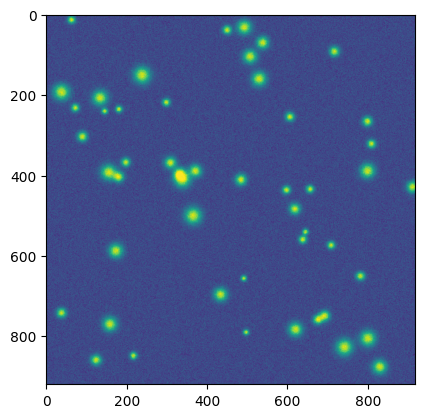

In [ ]:
plt.imshow(frames[0])

## Step 3: Compute the image structure function





In [ ]:
def compute_isf_optimized(frames, dt_range, chunk_size=100, q_range=None, checkpoint_path='/content/drive/MyDrive/ddm_checkpoint'):
    n_frames, height, width = frames.shape

    # Calculate q_values
    q_pixel = 2 * np.pi * np.fft.fftfreq(height)[:height//2]
    if q_range is not None:
        q_mask = (q_pixel >= q_range[0]) & (q_pixel <= q_range[1])
        q_values = q_pixel[q_mask]
    else:
        q_values = q_pixel

    # Initialize or load checkpoint
    checkpoint_file = f'{checkpoint_path}/isf_checkpoint.npz'
    if os.path.exists(checkpoint_file):
        checkpoint = np.load(checkpoint_file)
        isf = checkpoint['isf']
        last_dt_idx = checkpoint['last_dt_idx']
        print(f"Resuming from checkpoint at dt_index: {last_dt_idx}")
    else:
        isf = np.zeros((len(dt_range), len(q_values)), dtype=np.float64)
        last_dt_idx = 0
        os.makedirs(checkpoint_path, exist_ok=True)

    try:
        # Process each dt with checkpointing
        for i, dt in tqdm(enumerate(dt_range[last_dt_idx:], start=last_dt_idx),
                         total=len(dt_range), initial=last_dt_idx):
            fft_sum = np.zeros((height//2), dtype=np.float64)
            n_chunks = 0

            # Process in smaller sub-chunks for memory efficiency
            sub_chunk_size = min(chunk_size, 50)  # Limit sub-chunk size
            for j in range(0, n_frames - dt, sub_chunk_size):
                chunk_end = min(j + sub_chunk_size, n_frames - dt)

                # Free memory before heavy computation
                gc.collect()

                # Compute difference frames for sub-chunk
                diff_frames = frames[j+dt:chunk_end+dt] - frames[j:chunk_end]

                # Compute FFT and average over azimuthal angles
                fft_diff = np.abs(fft2(diff_frames, axes=(1, 2)))**2
                fft_radial = np.mean(fft_diff[:, :height//2, :width//2], axis=(0, 2))

                fft_sum += fft_radial
                n_chunks += 1

                # Clear memory
                del diff_frames, fft_diff
                gc.collect()

            # Average over chunks
            if n_chunks > 0:
                fft_avg = fft_sum / n_chunks
                if q_range is not None:
                    isf[i] = fft_avg[q_mask]
                else:
                    isf[i] = fft_avg

            # Save checkpoint every 10 dt values
            if (i + 1) % 10 == 0:
                np.savez(checkpoint_file, isf=isf, last_dt_idx=i+1)
                print(f"\nCheckpoint saved at dt_index: {i+1}")

            # Clear memory after each dt
            gc.collect()

    except Exception as e:
        # Save checkpoint if error occurs
        np.savez(checkpoint_file, isf=isf, last_dt_idx=i)
        print(f"\nError occurred. Checkpoint saved at dt_index: {i}")
        raise e

    # Save final results
    final_results_file = f'{checkpoint_path}/isf_final_results.npz'
    np.savez(final_results_file, isf=isf, q_values=q_values)
    print("\nFinal results saved successfully")

    return isf, q_values


In [ ]:
# Define parameters

# Calculate frames corresponding to gelation
frames_per_second = 1000/50  # 20 frames per second
max_delay = int(50 * frames_per_second)  # Cover up to 50 seconds
min_delay = int(0.1 * frames_per_second)  # Start from 0.1 seconds

dt_range = np.arange(min_delay, max_delay, 2)  # Step by 2 frames to reduce computation

q_range = [2.27, 9.82]  # Optional: Specify a q range to reduce computation
time_seconds = dt_range / frames_per_second

In [ ]:
dt_range

array([  2,   4,   6,   8,  10,  12,  14,  16,  18,  20,  22,  24,  26,
        28,  30,  32,  34,  36,  38,  40,  42,  44,  46,  48,  50,  52,
        54,  56,  58,  60,  62,  64,  66,  68,  70,  72,  74,  76,  78,
        80,  82,  84,  86,  88,  90,  92,  94,  96,  98, 100, 102, 104,
       106, 108, 110, 112, 114, 116, 118, 120, 122, 124, 126, 128, 130,
       132, 134, 136, 138, 140, 142, 144, 146, 148, 150, 152, 154, 156,
       158, 160, 162, 164, 166, 168, 170, 172, 174, 176, 178, 180, 182,
       184, 186, 188, 190, 192, 194, 196, 198, 200, 202, 204, 206, 208,
       210, 212, 214, 216, 218, 220, 222, 224, 226, 228, 230, 232, 234,
       236, 238, 240, 242, 244, 246, 248, 250, 252, 254, 256, 258, 260,
       262, 264, 266, 268, 270, 272, 274, 276, 278, 280, 282, 284, 286,
       288, 290, 292, 294, 296, 298, 300, 302, 304, 306, 308, 310, 312,
       314, 316, 318, 320, 322, 324, 326, 328, 330, 332, 334, 336, 338,
       340, 342, 344, 346, 348, 350, 352, 354, 356, 358, 360, 36

In [ ]:
time_seconds

array([ 0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ,  1.1,
        1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,  1.9,  2. ,  2.1,  2.2,
        2.3,  2.4,  2.5,  2.6,  2.7,  2.8,  2.9,  3. ,  3.1,  3.2,  3.3,
        3.4,  3.5,  3.6,  3.7,  3.8,  3.9,  4. ,  4.1,  4.2,  4.3,  4.4,
        4.5,  4.6,  4.7,  4.8,  4.9,  5. ,  5.1,  5.2,  5.3,  5.4,  5.5,
        5.6,  5.7,  5.8,  5.9,  6. ,  6.1,  6.2,  6.3,  6.4,  6.5,  6.6,
        6.7,  6.8,  6.9,  7. ,  7.1,  7.2,  7.3,  7.4,  7.5,  7.6,  7.7,
        7.8,  7.9,  8. ,  8.1,  8.2,  8.3,  8.4,  8.5,  8.6,  8.7,  8.8,
        8.9,  9. ,  9.1,  9.2,  9.3,  9.4,  9.5,  9.6,  9.7,  9.8,  9.9,
       10. , 10.1, 10.2, 10.3, 10.4, 10.5, 10.6, 10.7, 10.8, 10.9, 11. ,
       11.1, 11.2, 11.3, 11.4, 11.5, 11.6, 11.7, 11.8, 11.9, 12. , 12.1,
       12.2, 12.3, 12.4, 12.5, 12.6, 12.7, 12.8, 12.9, 13. , 13.1, 13.2,
       13.3, 13.4, 13.5, 13.6, 13.7, 13.8, 13.9, 14. , 14.1, 14.2, 14.3,
       14.4, 14.5, 14.6, 14.7, 14.8, 14.9, 15. , 15

In [ ]:
from google.colab import drive
import os

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# # Open this one if needed. Calculation took more than 2 hours
# # Create checkpoint directory in Google Drive
# checkpoint_path = '/content/drive/MyDrive/ddm_checkpoint'
# os.makedirs(checkpoint_path, exist_ok=True)

# # Run computation
# isf, q_values = compute_isf_optimized(frames, dt_range, chunk_size=200,
#                                     q_range=q_range,
#                                     checkpoint_path=checkpoint_path)

  2%|▏         | 10/499 [05:51<4:29:44, 33.10s/it]


Checkpoint saved at dt_index: 10


  4%|▍         | 20/499 [11:11<4:13:26, 31.75s/it]


Checkpoint saved at dt_index: 20


  6%|▌         | 30/499 [16:26<4:05:21, 31.39s/it]


Checkpoint saved at dt_index: 30


  8%|▊         | 40/499 [21:34<3:55:50, 30.83s/it]


Checkpoint saved at dt_index: 40


 10%|█         | 50/499 [26:33<3:44:57, 30.06s/it]


Checkpoint saved at dt_index: 50


 12%|█▏        | 60/499 [31:27<3:34:29, 29.31s/it]


Checkpoint saved at dt_index: 60


 14%|█▍        | 70/499 [36:16<3:26:29, 28.88s/it]


Checkpoint saved at dt_index: 70


 16%|█▌        | 80/499 [40:56<3:14:50, 27.90s/it]


Checkpoint saved at dt_index: 80


 18%|█▊        | 90/499 [45:31<3:08:09, 27.60s/it]


Checkpoint saved at dt_index: 90


 20%|██        | 100/499 [49:56<2:56:16, 26.51s/it]


Checkpoint saved at dt_index: 100


 22%|██▏       | 110/499 [54:13<2:46:39, 25.71s/it]


Checkpoint saved at dt_index: 110


 24%|██▍       | 120/499 [58:25<2:39:17, 25.22s/it]


Checkpoint saved at dt_index: 120


 26%|██▌       | 130/499 [1:02:30<2:30:32, 24.48s/it]


Checkpoint saved at dt_index: 130


 28%|██▊       | 140/499 [1:06:27<2:20:28, 23.48s/it]


Checkpoint saved at dt_index: 140


 30%|███       | 150/499 [1:10:20<2:13:05, 22.88s/it]


Checkpoint saved at dt_index: 150


 32%|███▏      | 160/499 [1:14:05<2:04:46, 22.08s/it]


Checkpoint saved at dt_index: 160


 34%|███▍      | 170/499 [1:17:44<1:58:48, 21.67s/it]


Checkpoint saved at dt_index: 170


 36%|███▌      | 180/499 [1:21:16<1:52:03, 21.08s/it]


Checkpoint saved at dt_index: 180


 38%|███▊      | 190/499 [1:24:40<1:44:25, 20.28s/it]


Checkpoint saved at dt_index: 190


 40%|████      | 200/499 [1:28:00<1:37:54, 19.65s/it]


Checkpoint saved at dt_index: 200


 42%|████▏     | 210/499 [1:31:11<1:30:48, 18.85s/it]


Checkpoint saved at dt_index: 210


 44%|████▍     | 220/499 [1:34:17<1:25:58, 18.49s/it]


Checkpoint saved at dt_index: 220


 46%|████▌     | 230/499 [1:37:15<1:18:39, 17.55s/it]


Checkpoint saved at dt_index: 230


 48%|████▊     | 240/499 [1:40:08<1:14:01, 17.15s/it]


Checkpoint saved at dt_index: 240


 50%|█████     | 250/499 [1:42:54<1:07:47, 16.34s/it]


Checkpoint saved at dt_index: 250


 52%|█████▏    | 260/499 [1:45:33<1:02:38, 15.73s/it]


Checkpoint saved at dt_index: 260


 54%|█████▍    | 270/499 [1:48:07<58:49, 15.41s/it]


Checkpoint saved at dt_index: 270


 56%|█████▌    | 280/499 [1:50:35<53:19, 14.61s/it]


Checkpoint saved at dt_index: 280


 58%|█████▊    | 290/499 [1:52:54<48:37, 13.96s/it]


Checkpoint saved at dt_index: 290


 60%|██████    | 300/499 [1:55:09<43:16, 13.05s/it]


Checkpoint saved at dt_index: 300


 62%|██████▏   | 310/499 [1:57:16<39:47, 12.63s/it]


Checkpoint saved at dt_index: 310


 64%|██████▍   | 320/499 [1:59:17<35:22, 11.86s/it]


Checkpoint saved at dt_index: 320


 66%|██████▌   | 330/499 [2:01:12<31:30, 11.18s/it]


Checkpoint saved at dt_index: 330


 68%|██████▊   | 340/499 [2:03:01<28:30, 10.76s/it]


Checkpoint saved at dt_index: 340


 70%|███████   | 350/499 [2:04:44<25:09, 10.13s/it]


Checkpoint saved at dt_index: 350


 72%|███████▏  | 360/499 [2:06:19<21:50,  9.43s/it]


Checkpoint saved at dt_index: 360


 74%|███████▍  | 370/499 [2:07:49<18:49,  8.76s/it]


Checkpoint saved at dt_index: 370


 76%|███████▌  | 380/499 [2:09:12<16:08,  8.14s/it]


Checkpoint saved at dt_index: 380


 78%|███████▊  | 390/499 [2:10:27<13:25,  7.39s/it]


Checkpoint saved at dt_index: 390


 80%|████████  | 400/499 [2:11:38<11:30,  6.98s/it]


Checkpoint saved at dt_index: 400


 82%|████████▏ | 410/499 [2:12:41<09:04,  6.12s/it]


Checkpoint saved at dt_index: 410


 84%|████████▍ | 420/499 [2:13:39<07:24,  5.63s/it]


Checkpoint saved at dt_index: 420


 86%|████████▌ | 430/499 [2:14:30<05:41,  4.95s/it]


Checkpoint saved at dt_index: 430


 88%|████████▊ | 440/499 [2:15:14<04:24,  4.49s/it]


Checkpoint saved at dt_index: 440


 90%|█████████ | 450/499 [2:15:51<02:53,  3.55s/it]


Checkpoint saved at dt_index: 450


 92%|█████████▏| 460/499 [2:16:22<01:49,  2.81s/it]


Checkpoint saved at dt_index: 460


 94%|█████████▍| 470/499 [2:16:47<01:07,  2.33s/it]


Checkpoint saved at dt_index: 470


 96%|█████████▌| 480/499 [2:17:05<00:29,  1.58s/it]


Checkpoint saved at dt_index: 480


 98%|█████████▊| 490/499 [2:17:17<00:08,  1.01it/s]


Checkpoint saved at dt_index: 490


100%|██████████| 499/499 [2:17:23<00:00, 16.52s/it]


Final results saved successfully


In [ ]:
# Load previously saved results if needed
def load_results(checkpoint_path='/content/drive/MyDrive/ddm_checkpoint'):
    results_file = f'{checkpoint_path}/isf_final_results.npz'
    if os.path.exists(results_file):
        data = np.load(results_file)
        return data['isf'], data['q_values']
    else:
        print("No saved results found")
        return None, None

In [ ]:
isf, q_values = load_results()

In [ ]:
isf

array([[1.03331232e+10, 1.03211827e+10, 1.03276887e+10, ...,
        9.32216939e+09, 9.33219445e+09, 9.36544869e+09],
       [1.01339814e+10, 1.01364105e+10, 1.01202688e+10, ...,
        9.17208566e+09, 9.15449274e+09, 9.16590097e+09],
       [1.00552850e+10, 1.00895005e+10, 1.00503425e+10, ...,
        9.13499096e+09, 9.12138483e+09, 9.14281726e+09],
       ...,
       [9.06440361e+09, 9.24299696e+09, 9.02801642e+09, ...,
        8.98809894e+09, 8.95824379e+09, 9.06530043e+09],
       [9.08701484e+09, 9.23639430e+09, 9.15839658e+09, ...,
        8.86736735e+09, 9.04898216e+09, 8.99977819e+09],
       [8.70152040e+09, 9.45862911e+09, 9.10719606e+09, ...,
        8.98435988e+09, 9.09826788e+09, 8.90444578e+09]])

In [ ]:
q_values

array([2.2742399 , 2.28106945, 2.287899  , 2.29472855, 2.3015581 ,
       2.30838765, 2.31521719, 2.32204674, 2.32887629, 2.33570584,
       2.34253539, 2.34936494, 2.35619449, 2.36302404, 2.36985359,
       2.37668314, 2.38351269, 2.39034224, 2.39717179, 2.40400133,
       2.41083088, 2.41766043, 2.42448998, 2.43131953, 2.43814908,
       2.44497863, 2.45180818, 2.45863773, 2.46546728, 2.47229683,
       2.47912638, 2.48595593, 2.49278548, 2.49961502, 2.50644457,
       2.51327412, 2.52010367, 2.52693322, 2.53376277, 2.54059232,
       2.54742187, 2.55425142, 2.56108097, 2.56791052, 2.57474007,
       2.58156962, 2.58839916, 2.59522871, 2.60205826, 2.60888781,
       2.61571736, 2.62254691, 2.62937646, 2.63620601, 2.64303556,
       2.64986511, 2.65669466, 2.66352421, 2.67035376, 2.6771833 ,
       2.68401285, 2.6908424 , 2.69767195, 2.7045015 , 2.71133105,
       2.7181606 , 2.72499015, 2.7318197 , 2.73864925, 2.7454788 ,
       2.75230835, 2.7591379 , 2.76596745, 2.77279699, 2.77962

In [ ]:
# !pip install google-colab
# # After computing ISF
# import pickle
# import os
# from google.colab import drive

# def save_ddm_results(isf, q_values, filename='ddm_results.pkl'):
#     """
#     Saves DDM results (isf, q_values, dt_range) to a pickle file in Google Drive.
#     """
#     results = {
#         'isf': isf,
#         'q_values': q_values,
#         'dt_range': dt_range
#     }

#     # Mount Google Drive if not already mounted
#     drive.mount('/content/drive')

#     # Create the directory if it doesn't exist
#     save_dir = '/content/drive/MyDrive/'
#     if not os.path.exists(save_dir):
#         os.makedirs(save_dir)

#     # Save to Google Drive
#     save_path = os.path.join(save_dir, filename)
#     with open(save_path, 'wb') as f:
#         pickle.dump(results, f)
#     print(f"Results saved to {save_path}")

# # Save the results after computation
# save_ddm_results(isf, q_values, filename='ddm_results_1_101.pkl')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.4 MB/s eta 0:00:00
Mounted at /content/drive
Results saved to /content/drive/MyDrive/ddm_results.pkl


In [ ]:
# import pickle
# import os
# from google.colab import drive

# def load_ddm_results(filename='ddm_results.pkl'):
#     # Mount Google Drive if not already mounted
#     drive.mount('/content/drive')

#     # Load from Google Drive
#     load_path = '/content/drive/MyDrive/' + filename

#     with open(load_path, 'rb') as f:
#         results = pickle.load(f)
#     return results['isf'], results['q_values']

# # Load previously saved results
# # isf, q_values = load_ddm_results(filename='ddm_results_1_101.pkl')

Mounted at /content/drive


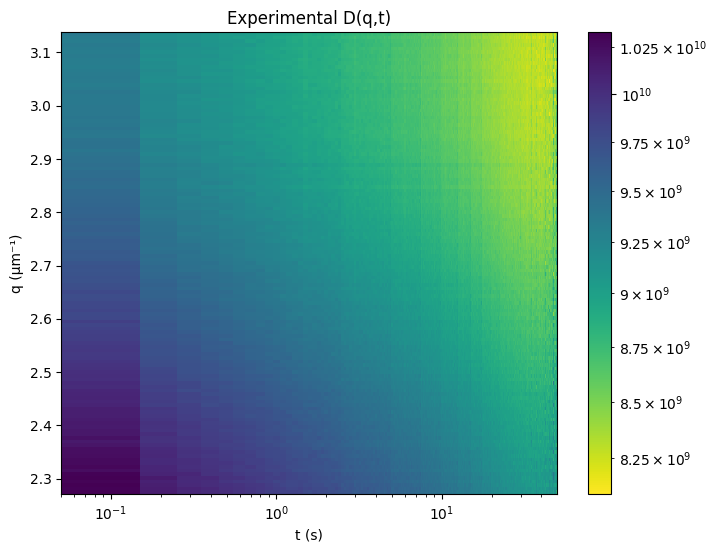

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

def plot_experimental_Dqt_2D(isf, q_values, dt_range, fps=20):

    # Convert frames to seconds
    time_seconds = dt_range / fps

    # Create 2D array for plotting
    Q, T = np.meshgrid(q_values, time_seconds)

    plt.figure(figsize=(8, 6))

    # Plot 2D heatmap
    plt.pcolormesh(T, Q, isf,
                   norm=matplotlib.colors.LogNorm(),
                   cmap='viridis_r')

    plt.xlabel('t (s)')
    plt.ylabel('q (µm⁻¹)')
    plt.title('Experimental D(q,t)')
    plt.colorbar()

    # Use log scale for time axis
    plt.xscale('log')
    plt.show()

# Plot the experimental D(q,t)
plot_experimental_Dqt_2D(isf, q_values, dt_range)


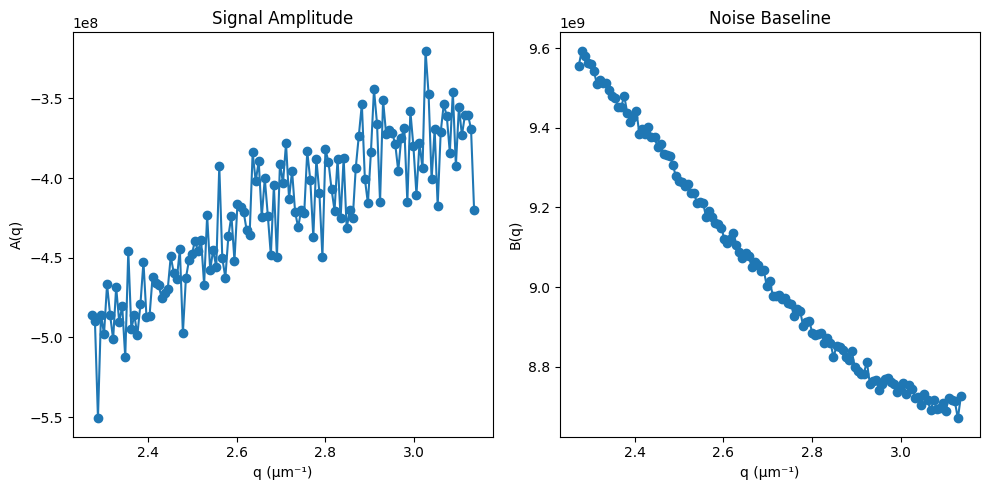

In [ ]:
def extract_and_plot_AB(isf, q_values, dt_range):
    """
    Extract A(q) and B(q) using optimization-based approach from the paper
    """
    n_q = len(q_values)
    A_q = np.zeros(n_q)
    B_q = np.zeros(n_q)

    # For each q value
    for i, q in enumerate(q_values):
        # Get long-time plateau for A(q)
        long_time_idx = int(0.8 * len(dt_range))  # Use last 20% of time points
        A_prime = np.mean(isf[long_time_idx:, i])

        # Get short-time behavior for B(q)
        short_time_idx = int(0.1 * len(dt_range))  # Use first 10% of time points
        B_q[i] = np.min(isf[:short_time_idx, i])

        # Calculate A(q)
        A_q[i] = A_prime - B_q[i]

    # Plot A(q) and B(q)
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.plot(q_values, A_q, 'o-')
    plt.xlabel('q (µm⁻¹)')
    plt.ylabel('A(q)')
    plt.title('Signal Amplitude')

    plt.subplot(1, 2, 2)
    plt.plot(q_values, B_q, 'o-')
    plt.xlabel('q (µm⁻¹)')
    plt.ylabel('B(q)')
    plt.title('Noise Baseline')

    plt.tight_layout()
    plt.show()

    return A_q, B_q

# Usage
A_q, B_q = extract_and_plot_AB(isf, q_values, dt_range)


## Step 4: Extract the Mean Squared Displacement (MSD)


<ipython-input-110-364d73123cbc>:14: RuntimeWarning:

invalid value encountered in log



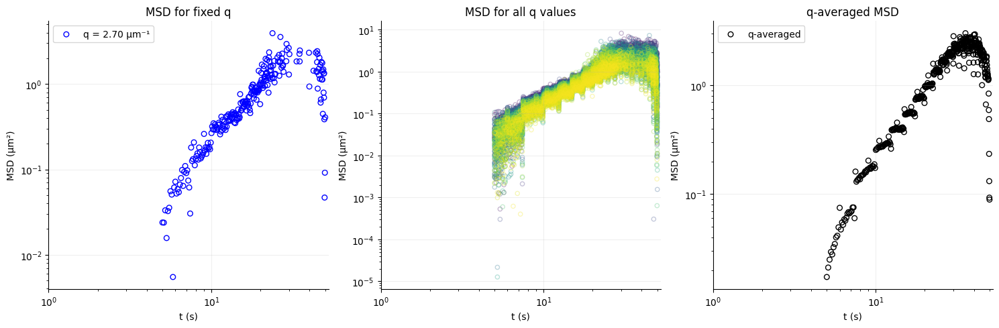

In [ ]:
def calculate_msd_with_visualization(D_qt, A_q, B_q, q_values, dt_range, fps=20):
    """
    Calculate MSD with visualization using hollow dots and legend
    """
    # Convert frames to seconds
    time_seconds = dt_range / fps

    # Initialize arrays
    msd = np.zeros(len(dt_range))
    msd_q_all = np.zeros((len(dt_range), len(q_values)))

    # Calculate MSD for each q value
    for q_idx, q in enumerate(q_values):
        msd_q = -4/q**2 * np.log(1 - (D_qt[:, q_idx] - B_q[q_idx])/A_q[q_idx])
        msd_q_all[:, q_idx] = msd_q

    # Average over q values
    msd = np.nanmean(msd_q_all, axis=1)

    # Create visualization plots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Plot 1: MSD calculation for fixed q
    q_idx = len(q_values)//2
    axes[0].scatter(time_seconds, msd_q_all[:, q_idx], facecolors='none',
                   edgecolors='blue', s=30, label=f'q = {q_values[q_idx]:.2f} μm⁻¹')
    axes[0].set_xlim(left=1)
    axes[0].set_xlabel('t (s)')
    axes[0].set_ylabel('MSD (μm²)')
    axes[0].set_title('MSD for fixed q')
    axes[0].grid(True, alpha=0.2)
    axes[0].spines['top'].set_visible(False)
    axes[0].spines['right'].set_visible(False)
    axes[0].set_xscale('log')
    axes[0].set_yscale('log')
    axes[0].legend()

    # Plot 2: MSD for all q values
    for q_idx, q in enumerate(q_values):
        axes[1].scatter(time_seconds, msd_q_all[:, q_idx], facecolors='none',
                       edgecolors=plt.cm.viridis(q_idx/len(q_values)), s=20, alpha=0.3,
                       label=f'q = {q:.2f} μm⁻¹')
    axes[1].set_xlim(left=1)
    axes[1].set_xlabel('t (s)')
    axes[1].set_ylabel('MSD (μm²)')
    axes[1].set_title('MSD for all q values')
    axes[1].grid(True, alpha=0.2)
    axes[1].spines['top'].set_visible(False)
    axes[1].spines['right'].set_visible(False)
    axes[1].set_xscale('log')
    axes[1].set_yscale('log')

    # Plot 3: Final averaged MSD
    axes[2].scatter(time_seconds, msd, facecolors='none', edgecolors='black',
                   s=30, label='q-averaged')
    axes[2].set_xlim(left=1)
    axes[2].set_xlabel('t (s)')
    axes[2].set_ylabel('MSD (μm²)')
    axes[2].set_title('q-averaged MSD')
    axes[2].grid(True, alpha=0.2)
    axes[2].spines['top'].set_visible(False)
    axes[2].spines['right'].set_visible(False)
    axes[2].set_xscale('log')
    axes[2].set_yscale('log')
    axes[2].legend()

    plt.tight_layout()
    plt.show()

    return msd

# Calculate MSD with visualization
msd_avg_ddm = calculate_msd_with_visualization(isf, A_q, B_q, q_values, dt_range)


In [ ]:
def calculate_msd_with_visualization(msd, dt_range):
    """
    Calculate MSD with visualization using plotly for interactive hover, showing only q-averaged MSD
    """
    # # Convert frames to seconds
    # time_seconds = dt_range / fps

    # # Initialize arrays
    # msd = np.zeros(len(dt_range))
    # msd_q_all = np.zeros((len(dt_range), len(q_values)))

    # # Calculate MSD for each q value
    # # Use np.errstate to suppress the invalid value warning
    # with np.errstate(invalid='ignore', divide='ignore'):
    #     for q_idx, q in enumerate(q_values):
    #         msd_q = -4/q**2 * np.log(1 - (D_qt[:, q_idx] - B_q[q_idx])/A_q[q_idx])
    #         # Replace invalid values with NaN
    #         msd_q[~np.isfinite(msd_q)] = np.nan
    #         msd_q_all[:, q_idx] = msd_q

    # # Average over q values, ignoring NaN values
    # msd = np.nanmean(msd_q_all, axis=1)

    # Create figure
    fig = go.Figure()

    # Plot q-averaged MSD only
    fig.add_trace(
        go.Scatter(
            x=time_seconds,
            y=msd,
            mode='markers',
            name='q-averaged',
            customdata=np.column_stack((time_seconds, msd)),
            hovertemplate='Time: %{customdata[0]:.2f}s<br>MSD: %{customdata[1]:.2e} μm²',
            marker=dict(
                color='black',
                size=6,
                line=dict(color='black', width=1),
                symbol='circle-open'
            )
        )
    )

    # Update layout
    fig.update_xaxes(
        type="log",
        title="t (s)",
        range=[np.log10(0.1), np.log10(55)]  # Set x-axis range from 0.1 to 55 seconds
    )
    fig.update_yaxes(
        type="log",
        title="MSD (μm²)"
    )

    fig.update_layout(
        height=400,
        width=800,  # Reduced width since we only have one plot
        showlegend=True,
        title_text="q-averaged MSD",
        hovermode='closest',
        template='plotly_white'
    )

    # Display the figure
    fig.show()

# Calculate MSD with visualization
calculate_msd_with_visualization(msd_avg_ddm, time_seconds)


In [ ]:
msd_avg_ddm

array([-0.53721115, -0.43753161, -0.40649639, -0.38339305, -0.36375876,
       -0.34439817, -0.32718348, -0.31247286, -0.29665728, -0.28427181,
       -0.27201398, -0.25683678, -0.24496878, -0.2370024 , -0.21149965,
       -0.2186566 , -0.21213124, -0.20548954, -0.20109905, -0.18845219,
       -0.18016871, -0.1737551 , -0.16552307, -0.16746045, -0.13165907,
       -0.12259409, -0.11503784, -0.11036979, -0.10315594, -0.07640675,
       -0.09230718, -0.08988877, -0.0833889 , -0.08138682, -0.07573558,
       -0.07377988, -0.06629238, -0.06029941, -0.05841679, -0.05741187,
       -0.05007146, -0.04611525, -0.03841176, -0.03882038, -0.0114173 ,
       -0.03220799, -0.03056567, -0.03057616, -0.04107169,  0.01733691,
        0.0211742 ,  0.02502036,  0.02945656,  0.02793793,  0.03255423,
        0.03485386,  0.04008543,  0.04150883,  0.04957109,  0.07489641,
        0.04734291,  0.05498634,  0.05235987,  0.05868882,  0.05720205,
        0.06094665,  0.0663665 ,  0.06840212,  0.06668027,  0.06

In [ ]:
def plot_top_percent_msd(msd, time_seconds, top_percent=10):
    """
    Plot the top X% q-averaged MSD values

    Parameters:
    msd (numpy.ndarray): Array of MSD values
    time_seconds (numpy.ndarray): Array of time points
    top_percent (float): Percentage of top values to show (default: 10)
    """
    # Calculate the threshold for top X% MSD values
    threshold = np.percentile(msd, 100 - top_percent)
    top_indices = np.where(msd >= threshold)
    top_msd = msd[top_indices]
    top_time = time_seconds[top_indices]

    # Create figure
    fig = go.Figure()

    # Add scatter plot for top X% MSD values
    fig.add_trace(
        go.Scatter(
            x=top_time,
            y=top_msd,
            mode='markers',
            name=f'Top {top_percent}% MSD',
            customdata=np.column_stack((top_time, top_msd)),
            hovertemplate='Time: %{customdata[0]:.2f}s<br>MSD: %{customdata[1]:.2e} μm²',
            marker=dict(
                color='red',
                size=6,
                line=dict(color='red', width=1)
            )
        )
    )

    # Update layout
    fig.update_xaxes(
        type="log",
        title="Time (s)"
    )
    fig.update_yaxes(
        type="log",
        title="MSD (μm²)"
    )

    fig.update_layout(
        height=400,
        width=800,
        showlegend=True,
        title_text=f"Top {top_percent}% q-averaged MSD Values",
        hovermode='closest',
        template='plotly_white'
    )

    # Display the figure
    fig.show()

    return top_msd, top_time

# Convert frames to seconds
time_seconds = dt_range / frames_per_second

# Calculate and plot top x% MSD values
top_msd, top_time = plot_top_percent_msd(msd_avg_ddm, time_seconds, top_percent=3)


In [ ]:
# def calculate_moduli_from_msd(msd, time_seconds, temperature=303, particle_radius=0.05e-6):
#     """
#     Calculate viscoelastic moduli using GSER with proper implementation

#     Parameters:
#     msd (array): Mean squared displacement data
#     time_seconds (array): Time points in seconds
#     temperature (float): Temperature in Kelvin (default 303K = 30°C)
#     particle_radius (float): Particle radius in meters (default 0.05e-6 m = 50 nm radius)
#     """
#     # Physical constants
#     kB = 1.380649e-23  # Boltzmann constant in J/K

#     # Calculate frequency points (omega)
#     omega = 1/time_seconds

#     # Calculate the local power law approximation
#     alpha = np.gradient(np.log(msd), np.log(time_seconds))

#     # Calculate complex modulus magnitude using GSER
#     G_magnitude = (kB * temperature) / (np.pi * particle_radius * msd)

#     # Calculate storage (G') and loss (G") moduli
#     G_prime = G_magnitude * np.cos(alpha * np.pi/2)
#     G_double_prime = G_magnitude * np.sin(alpha * np.pi/2)

#     # Calculate complex modulus (G*)
#     G_star = np.sqrt(G_prime**2 + G_double_prime**2)

#     # Create visualization
#     fig = go.Figure()

#     # Add complex modulus (G*)
#     fig.add_trace(
#         go.Scatter(
#             x=omega,
#             y=G_star,
#             mode='markers',
#             name='G* (Complex)',
#             marker=dict(
#                 color='green',
#                 size=8,
#                 symbol='triangle-up-open'
#             )
#         )
#     )

#     # Add storage modulus (G')
#     fig.add_trace(
#         go.Scatter(
#             x=omega,
#             y=G_prime,
#             mode='markers',
#             name="G' (Storage)",
#             marker=dict(
#                 color='blue',
#                 size=8,
#                 symbol='circle-open'
#             )
#         )
#     )

#     # Add loss modulus (G")
#     fig.add_trace(
#         go.Scatter(
#             x=omega,
#             y=G_double_prime,
#             mode='markers',
#             name='G" (Loss)',
#             marker=dict(
#                 color='red',
#                 size=8,
#                 symbol='x-open'
#             )
#         )
#     )

#     # Update layout
#     fig.update_layout(
#         xaxis_type="log",
#         yaxis_type="log",
#         xaxis=dict(
#             title="ω (rad/s)",
#             range=[-2, 0],  # 0.01 to 1 rad/s
#             showgrid=True,
#             gridwidth=1,
#             gridcolor='lightgray'
#         ),
#         yaxis=dict(
#             title="G', G\", G* (Pa)",
#             range=[-17, 2],
#             showgrid=True,
#             gridwidth=1,
#             gridcolor='lightgray'
#         ),
#         title="Viscoelastic Moduli",
#         showlegend=True,
#         template='plotly_white',
#         width=800,
#         height=600
#     )

#     fig.show()

#     return G_prime, G_double_prime, G_star, omega



In [ ]:
# G_prime, G_double_prime, G_star, omega = calculate_moduli_from_msd(msd, time_seconds, temperature=303, particle_radius=0.05e-6)

In [ ]:
time_seconds

array([ 0.1,  0.2,  0.3,  0.4,  0.5,  0.6,  0.7,  0.8,  0.9,  1. ,  1.1,
        1.2,  1.3,  1.4,  1.5,  1.6,  1.7,  1.8,  1.9,  2. ,  2.1,  2.2,
        2.3,  2.4,  2.5,  2.6,  2.7,  2.8,  2.9,  3. ,  3.1,  3.2,  3.3,
        3.4,  3.5,  3.6,  3.7,  3.8,  3.9,  4. ,  4.1,  4.2,  4.3,  4.4,
        4.5,  4.6,  4.7,  4.8,  4.9,  5. ,  5.1,  5.2,  5.3,  5.4,  5.5,
        5.6,  5.7,  5.8,  5.9,  6. ,  6.1,  6.2,  6.3,  6.4,  6.5,  6.6,
        6.7,  6.8,  6.9,  7. ,  7.1,  7.2,  7.3,  7.4,  7.5,  7.6,  7.7,
        7.8,  7.9,  8. ,  8.1,  8.2,  8.3,  8.4,  8.5,  8.6,  8.7,  8.8,
        8.9,  9. ,  9.1,  9.2,  9.3,  9.4,  9.5,  9.6,  9.7,  9.8,  9.9,
       10. , 10.1, 10.2, 10.3, 10.4, 10.5, 10.6, 10.7, 10.8, 10.9, 11. ,
       11.1, 11.2, 11.3, 11.4, 11.5, 11.6, 11.7, 11.8, 11.9, 12. , 12.1,
       12.2, 12.3, 12.4, 12.5, 12.6, 12.7, 12.8, 12.9, 13. , 13.1, 13.2,
       13.3, 13.4, 13.5, 13.6, 13.7, 13.8, 13.9, 14. , 14.1, 14.2, 14.3,
       14.4, 14.5, 14.6, 14.7, 14.8, 14.9, 15. , 15

In [ ]:
# prompt: could you put crossover_times and omega into a np dataframe of 2 column

import pandas as pd
import numpy as np

# Assuming you have 'omega' and 'crossover_times' defined from previous calculations
# Replace with your actual variable names if they are different

# Example data (replace with your actual data)
# omega = 1/time_seconds
# crossover_times = np.array([1, 2, 3, 4, 5])

# Create the DataFrame
df = pd.DataFrame({'crossover_times': time_seconds, 'omega': 1/time_seconds})

# Display the DataFrame
df

In [ ]:
# Convert frames to seconds
time_seconds = dt_range / frames_per_second

# Calculate gel time and moduli
gel_time, crossover_idx, crossover_times, G_star, G_prime, G_double_prime = calculate_gel_time_mpt(msd_avg_ddm, time_seconds, T=303, a=0.05e-6)

# Print gel time
if gel_time is not None:
    print(f"Gel time: {gel_time:.2f} seconds")
    print(f"Crossover index: {crossover_idx}")
    print(f"Crossover times: {crossover_times}")
    omega = [round(2 * np.pi / t, 2) for t in crossover_times]
    print(f"Crossover omega: {omega}")
else:
    print("No gel point detected")

# Plot results
plot_rheology(time_seconds, G_star, G_prime, G_double_prime, gel_time)

Gel time: 5.30 seconds
Crossover index: 52
Crossover times: [5.3, 5.4, 6.1, 6.2, 6.4, 6.7, 6.8, 6.9, 7.1, 7.2, 7.3, 7.5, 7.9, 8.1, 8.5, 8.8, 9.0, 9.2, 9.3, 9.4, 9.6, 9.9, 10.0, 10.4, 10.5, 10.9, 11.0, 11.3, 11.7, 11.8, 11.9, 12.1, 12.3, 12.4, 12.5, 12.8, 12.9, 13.4, 13.5, 13.7, 13.9, 14.0, 14.3, 14.4, 14.5, 14.6, 14.8, 14.9, 15.0, 15.1, 15.2, 15.4, 15.8, 16.4, 17.0, 17.1, 17.2, 17.5, 17.6, 17.9, 18.1, 18.2, 18.3, 18.4, 18.7, 18.8, 19.2, 19.6, 20.2, 20.4, 20.8, 21.1, 21.2, 21.3, 21.6, 21.7, 21.9, 22.1, 22.4, 22.8, 22.9, 23.1, 23.2, 23.4, 23.5, 23.6, 24.0, 24.6, 24.8, 25.1, 25.3, 25.5, 25.7, 25.9, 26.1, 26.5, 26.6, 26.9, 27.2, 27.3, 27.6, 27.8, 28.0, 28.2, 28.3, 28.6, 28.7, 28.9, 29.0, 29.1, 29.3, 29.4, 29.5, 29.6, 29.7, 29.8, 30.1, 30.4, 30.6, 30.7, 30.8, 30.9, 31.1, 31.2, 31.4, 31.6, 31.9, 32.1, 32.2, 32.4, 32.5, 32.6, 33.2, 33.5, 33.6, 33.7, 33.9, 34.0, 34.2, 34.6, 34.7, 34.8, 35.0, 35.2, 35.5, 35.7, 35.8, 36.0, 36.1, 36.4, 36.5, 36.6, 36.7, 36.8, 36.9, 37.0, 37.1, 37.4, 37.8, 38.0, 3

<ipython-input-99-5e8292ca882e>:13: RuntimeWarning:

invalid value encountered in log



In [ ]:
omega = 2 * np.pi / time_seconds

# Calculate viscosity and elasticity metrics
eta_prime, eta_double_prime = calculate_complex_viscosity(G_star, omega)
tan_delta, J = calculate_elasticity_metrics(G_prime, G_double_prime)

# Create visualization
plot_rheological_properties(omega, eta_prime, eta_double_prime, tan_delta, J)

In [ ]:
import pandas as pd
import numpy as np

# Assuming you have 'omega' and 'crossover_times' defined from previous calculations
# Replace with your actual variable names if they are different

# Example data (replace with your actual data)
omega = np.array(omega)
crossover_times = np.array(crossover_times)

# Get the minimum length among all arrays
min_len = min(len(crossover_times), len(omega), len(G_star), len(G_prime), len(G_double_prime), len(msd_avg_ddm))

# Create the DataFrame using only the first min_len elements of each array
df = pd.DataFrame({
    'crossover_times (t)': crossover_times[:min_len],
    'omega (rad/s)': omega[:min_len],
    'msd_avg_ddm': msd_avg_ddm[:min_len],
    'G_star': G_star[:min_len],
    'G_prime': G_prime[:min_len],
    'G_double_prime': G_double_prime[:min_len]
})

# Display the DataFrame
df

,crossover_times (t),omega (rad/s),msd_avg_ddm,G_star,G_prime,G_double_prime
0,5.3,1.19,-0.537211,-1.652494e-14,NaN,NaN
1,5.4,1.16,-0.437532,-2.028969e-14,NaN,NaN
2,6.1,1.03,-0.406496,-2.183877e-14,NaN,NaN
3,6.2,1.01,-0.383393,-2.315477e-14,NaN,NaN
4,6.4,0.98,-0.363759,-2.440458e-14,NaN,NaN
...,...,...,...,...,...,...
208,49.0,0.13,1.003438,8.846965e-15,7.613246e-16,8.814147e-15
209,49.3,0.13,1.230623,7.213726e-15,2.509254e-15,6.763245e-15
210,49.4,0.13,1.012782,8.765339e-15,7.970887e-15,3.646385e-15
211,49.8,0.13,0.982009,9.040017e-15,7.989123e-15,4.230345e-15


# Archived old codes

## Particle Detection and Tracking

In [ ]:
# def detect_particles(frame, diameter=9, minmass=400):
#     """Detect particles in a single frame"""
#     # Apply bandpass filter
#     frame = tp.bandpass(frame, 1, diameter)

#     # Locate particles
#     features = tp.locate(frame, diameter,
#                         minmass=minmass,
#                         separation=diameter+1)
#     return features

# def track_particles(frames, diameter=9, search_range=5, memory=3):
#     """Track particles across frames"""
#     # Batch process frames
#     f = tp.batch(frames, diameter,
#                  minmass=400,
#                  separation=diameter+1,
#                  processes=1)

#     # Link particles into trajectories
#     trajectories = tp.link_df(f, search_range, memory=memory)

#     # Filter trajectories
#     trajectories = tp.filter_stubs(trajectories, threshold=50)

#     return trajectories

## Analysis Functions

In [ ]:
# def compute_msd(trajectories, fps=20, max_lagtime=100, mpp=1):
#     """Compute mean squared displacement"""
#     im = tp.imsd(trajectories, fps=fps, max_lagtime=max_lagtime, mpp=mpp)
#     return im

# def detect_gelation_time(msd_df, fps=20):
#     """Detect gelation time from MSD data
#     Returns gelation time in seconds"""
#     times = msd_df.index.values
#     msd_values = msd_df.mean(axis=1).values

#     # Calculate numerical derivative in log-log space
#     d_msd = np.gradient(np.log(msd_values), np.log(times))

#     # Find where slope becomes approximately zero (plateau)
#     threshold = 0.1
#     gelation_idx = np.where(abs(d_msd) < threshold)[0]

#     if len(gelation_idx) > 0:
#         return times[gelation_idx[0]]
#     else:
#         return None

# def compute_moduli(msd_df, temperature=298):
#     """Compute viscoelastic moduli using GSER"""
#     # Constants
#     kB = 1.380649e-23  # Boltzmann constant
#     a = 0.25e-6        # particle radius (m)

#     # Frequency range
#     omega = 1/msd_df.index.values

#     # Complex modulus using GSER
#     G_star = 6*np.pi*kB*temperature/(6*a*msd_df.mean(axis=1).values)

#     # Storage and loss moduli
#     G_prime = np.abs(G_star) * np.cos(np.pi/4)   # elastic
#     G_dprime = np.abs(G_star) * np.sin(np.pi/4)  # viscous

#     return G_star, G_prime, G_dprime

## Main Analysis Pipeline


In [ ]:
# def analyze_hydrogel(url):
#     """Main analysis pipeline"""
#     # Load video
#     print("Loading video...")
#     frames = load_video(url)

#     # Track particles
#     print("Tracking particles...")
#     trajectories = track_particles(frames)

#     # Compute MSD
#     print("Computing MSD...")
#     msd = compute_msd(trajectories)

#     # Get gelation time
#     print("Computing Gelation time...")
#     gel_time = detect_gelation_time(msd)

#     # Compute moduli
#     print("Computing Moduli...")
#     G_star, G_prime, G_dprime = compute_moduli(msd)

#     return {
#         'frames': frames,
#         'trajectories': trajectories,
#         'msd': msd,
#         'gelation_time': gel_time,
#         'G_star': G_star,
#         'G_prime': G_prime,
#         'G_dprime': G_dprime
#     }

# # Run analysis
# # url = 'https://drive.google.com/file/d/1-mTp7X5D_2ub1U_Qw1qC9HLlWeXBelwC/view?usp=sharing' # Original video
# url = 'https://drive.google.com/file/d/1mLjIIbHZ0spEw1vHQPeED_YnZp7umKI1/view?usp=sharing' # Cropped 4k
# results = analyze_hydrogel(url)

Frame 999: 34 trajectories present.
Computing MSD...
Computing Gelation time...
Computing Moduli...


In [ ]:
# print(results)

{'frames': (ImageIOReader,) processed through proc_func. Original repr:
    <FramesSequenceND>
    Axes: 3
    Axis 'x' size: 918
    Axis 'y' size: 920
    Axis 't' size: 1000
    Pixel Datatype: uint8, 'trajectories':                 y           x         mass      size       ecc     signal  \
frame                                                                       
610    422.480627  156.206955   847.517138  2.598649  0.078443  27.551115   
611    426.145727  155.579269   964.955700  2.637153  0.065523  28.798358   
612    427.138590  153.381489   914.488096  2.628605  0.107281  28.213883   
613    427.845620  155.314657   826.846532  2.631914  0.110981  27.537647   
614    427.051471  153.204528   828.693066  2.549851  0.082191  27.740693   
...           ...         ...          ...       ...       ...        ...   
999    384.004068  126.129718  1289.553601  2.656152  0.014596  36.428068   
999     71.886147  459.907825   826.771428  2.476004  0.044207  32.348124   
999     89

## Visualization Functions

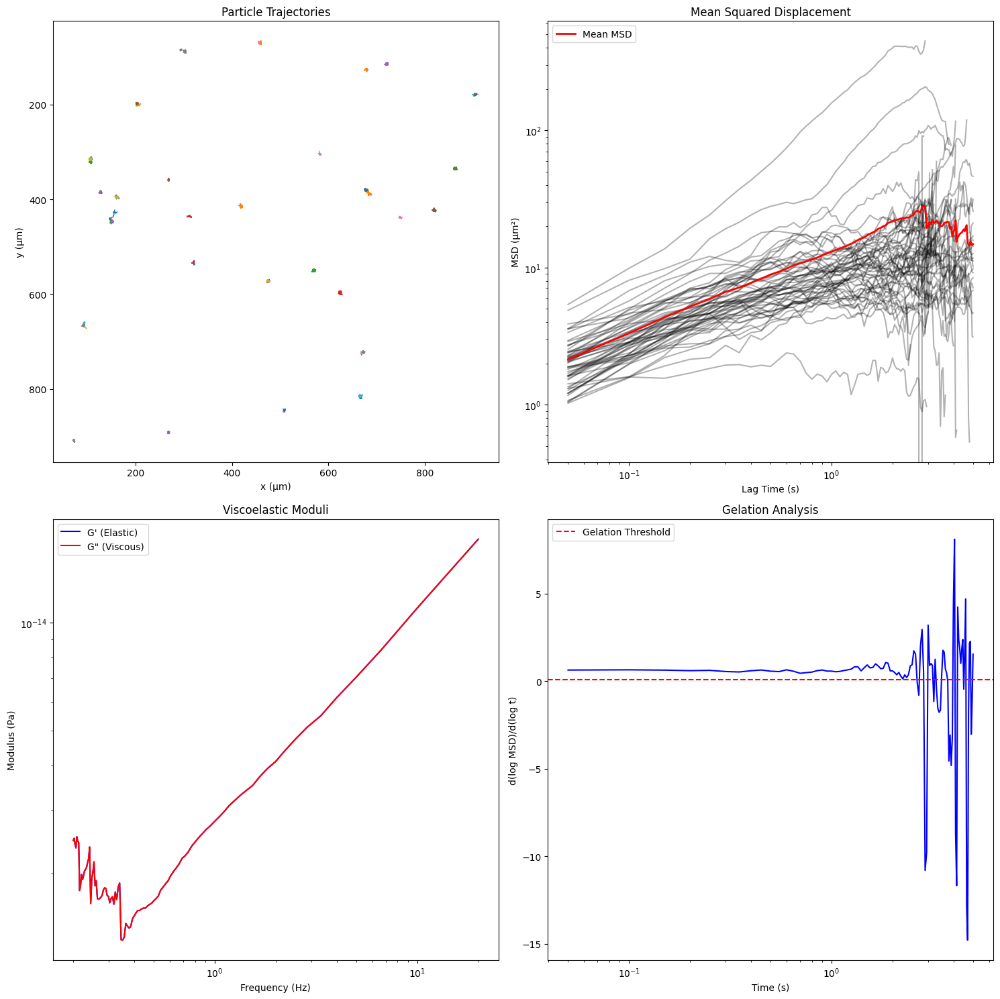

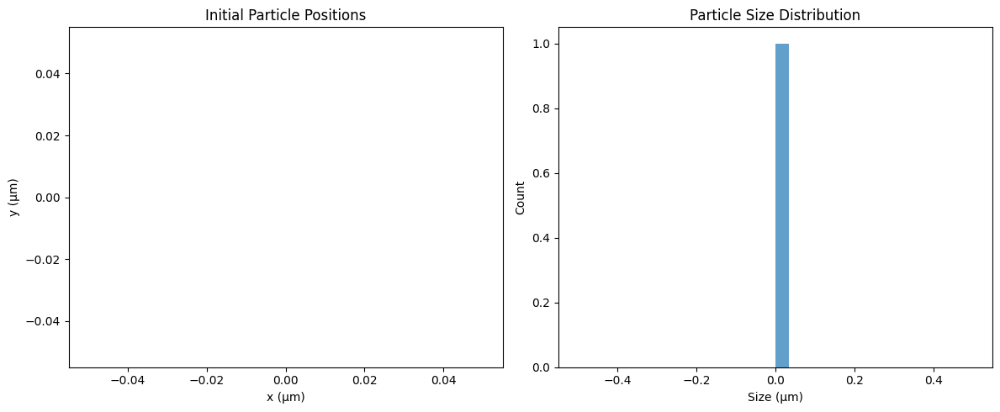

In [ ]:
# def plot_tracking_results(results):
#     """Plot comprehensive tracking analysis results"""
#     fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 15))

#     # Plot particle trajectories
#     tp.plot_traj(results['trajectories'], ax=ax1)
#     ax1.set_title('Particle Trajectories')
#     ax1.set_xlabel('x (μm)')
#     ax1.set_ylabel('y (μm)')

#     # Plot MSD over time
#     times = results['msd'].index.values
#     for col in results['msd'].columns:
#         ax2.loglog(times, results['msd'][col], 'k-', alpha=0.3)
#     ax2.loglog(times, results['msd'].mean(axis=1), 'r-', linewidth=2, label='Mean MSD')
#     ax2.set_title('Mean Squared Displacement')
#     ax2.set_xlabel('Lag Time (s)')
#     ax2.set_ylabel('MSD (μm²)')
#     ax2.legend()

#     # Plot viscoelastic moduli
#     omega = 1/times  # frequency range
#     ax3.loglog(omega, results['G_prime'], 'b-', label="G' (Elastic)")
#     ax3.loglog(omega, results['G_dprime'], 'r-', label='G" (Viscous)')
#     ax3.set_title('Viscoelastic Moduli')
#     ax3.set_xlabel('Frequency (Hz)')
#     ax3.set_ylabel('Modulus (Pa)')
#     ax3.legend()

#     # Plot MSD derivative for gelation analysis
#     d_msd = np.gradient(np.log(results['msd'].mean(axis=1)), np.log(times))
#     ax4.semilogx(times, d_msd, 'b-')
#     ax4.axhline(y=0.1, color='r', linestyle='--', label='Gelation Threshold')
#     ax4.set_title('Gelation Analysis')
#     ax4.set_xlabel('Time (s)')
#     ax4.set_ylabel('d(log MSD)/d(log t)')
#     ax4.legend()

#     plt.tight_layout()
#     plt.show()

# def plot_particle_distribution(results):
#     """Plot particle spatial distribution and statistics"""
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

#     # Plot particle positions in first frame
#     frame0 = results['trajectories'][results['trajectories'].frame == 0]
#     ax1.scatter(frame0.x, frame0.y, alpha=0.6)
#     ax1.set_title('Initial Particle Positions')
#     ax1.set_xlabel('x (μm)')
#     ax1.set_ylabel('y (μm)')

#     # Plot particle size distribution
#     ax2.hist(frame0.size, bins=30, alpha=0.7)
#     ax2.set_title('Particle Size Distribution')
#     ax2.set_xlabel('Size (μm)')
#     ax2.set_ylabel('Count')

#     plt.tight_layout()
#     plt.show()

# # Call visualization functions
# plot_tracking_results(results)
# plot_particle_distribution(results)